In [1]:
import numpy as np
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset
from pathlib import Path
import matplotlib.pyplot as plt

In [2]:


class TactileSequenceDataset(Dataset):
    """
    触覚センサ npy データ用 Dataset クラス

    - 入力ファイル: shape (T, n_taxels, 3)
    - seq_start〜seq_end ステップを切り出し
    - (seq_len, n_taxels, 3) -> (seq_len, n_taxels*3) にフラット化
    - ESN 用に (1, seq_len, feature_dim) に reshape し、バッチ化で
      (batch_size, 1, seq_len, feature_dim) になるようにする
    """

    def __init__(self, root_dir, dataset_params):
        """
        Args:
            root_dir: クラスディレクトリが並んでいるルートパス
                      例: dataset_root/
                            paper_A4/
                              xxx.npy
                            cloth/
                              yyy.npy
            dataset_params:
                - "seq_start": 切り出し開始インデックス（含む）
                - "seq_end"  : 切り出し終了インデックス（含まない）
        """
        super().__init__()
        self.root_dir = Path(root_dir)
        self.seq_start = int(dataset_params["seq_start"])
        self.seq_end   = int(dataset_params["seq_end"])
        self.dtype     = torch.float32  # ← カンマ削除

        # クラスディレクトリを列挙
        self.class_names = sorted(
            [d.name for d in self.root_dir.iterdir() if d.is_dir()]
        )
        if not self.class_names:
            raise RuntimeError(f"No class directories under {self.root_dir}")

        self.class_to_idx = {c: i for i, c in enumerate(self.class_names)}
        self.num_classes  = len(self.class_names)  # ★ one-hot 用

        # 各 npy ファイルのパスとラベルを列挙
        self.samples = []  # list of (path, label_idx)
        for class_name in self.class_names:
            class_dir = self.root_dir / class_name
            for npy_path in sorted(class_dir.glob("*.npy")):
                self.samples.append((npy_path, self.class_to_idx[class_name]))

        if not self.samples:
            raise RuntimeError(f"No .npy files found under {self.root_dir}")

        # シーケンス長を確認 (最初のサンプルでチェック)
        arr0 = np.load(self.samples[0][0])
        T, n_taxels, axes = arr0.shape
        assert axes == 3, f"Last dimension must be 3 (x,y,z), got {axes}"
        if self.seq_end > T:
            raise ValueError(
                f"seq_end({self.seq_end}) is larger than T({T}). "
                "Please adjust seq_start/seq_end."
            )

        self.original_T = T
        self.n_taxels   = n_taxels
        self.seq_len    = self.seq_end - self.seq_start
        self.feature_dim = self.n_taxels * 3  # x, y, z をまとめた次元

        print("=== TactileSequenceDataset initialized ===")
        print(f"root_dir     : {self.root_dir}")
        print(f"num_classes  : {self.num_classes}")
        print(f"num_samples  : {len(self.samples)}")
        print(f"original T   : {self.original_T}")
        print(f"seq range    : [{self.seq_start}, {self.seq_end}) -> seq_len={self.seq_len}")
        print(f"n_taxels     : {self.n_taxels}")
        print(f"feature_dim  : {self.feature_dim} (= n_taxels * 3)")
        print("class_to_idx : ", self.class_to_idx)
        print("=========================================")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        npy_path, label_idx = self.samples[idx]
        arr = np.load(npy_path)  # shape (T, n_taxels, 3)

        # 指定区間を切り出し
        seq = arr[self.seq_start:self.seq_end]  # (seq_len, n_taxels, 3)

        # (seq_len, n_taxels, 3) -> (seq_len, n_taxels * 3)
        seq = seq.reshape(self.seq_len, self.feature_dim)

        # torch.Tensor に変換 (seq_len, feature_dim)
        x = torch.from_numpy(seq).to(self.dtype)

        # ESN が期待する (batch, channel_size, seq_len, input_size) に合わせて
        # channel_size = 1 として (1, seq_len, feature_dim) に変換
        x = x.unsqueeze(0)  # (1, seq_len, feature_dim)

        # ラベルを one-hot ベクトルに変換
        label_idx_tensor = torch.tensor(label_idx, dtype=torch.long)
        y = F.one_hot(label_idx_tensor, num_classes=self.num_classes).to(self.dtype)
        # y.shape -> (num_classes,)  バッチ化後: (batch_size, num_classes)

        return x, y


=== TactileSequenceDataset initialized ===
root_dir     : All_matarials
num_classes  : 25
num_samples  : 250
original T   : 1255
seq range    : [400, 1200) -> seq_len=800
n_taxels     : 16
feature_dim  : 48 (= n_taxels * 3)
class_to_idx :  {'01_table_cover': 0, '02_fur_scarf': 1, '03_washing_towel': 2, '04_carpet1': 3, '05_bubble_wrap': 4, '06_fleece_scarf': 5, '07_knit_hat1': 6, '08_body_towel1': 7, '09_body_towel2': 8, '10_carpet2': 9, '11_work_gloves': 10, '12_knit_hat2': 11, '13_toilet_mat1': 12, '14_floor_mat': 13, '15_sponge1': 14, '16_printed_tatami': 15, '17_cushion1': 16, '18_mop': 17, '19_toilet_mat2': 18, '20_fleece_sock': 19, '21_cushion': 20, '22_carpet3': 21, '23_fleece_mat': 22, '24_carpet4': 23, '25_sponge2': 24}

===== class 0: 01_table_cover =====


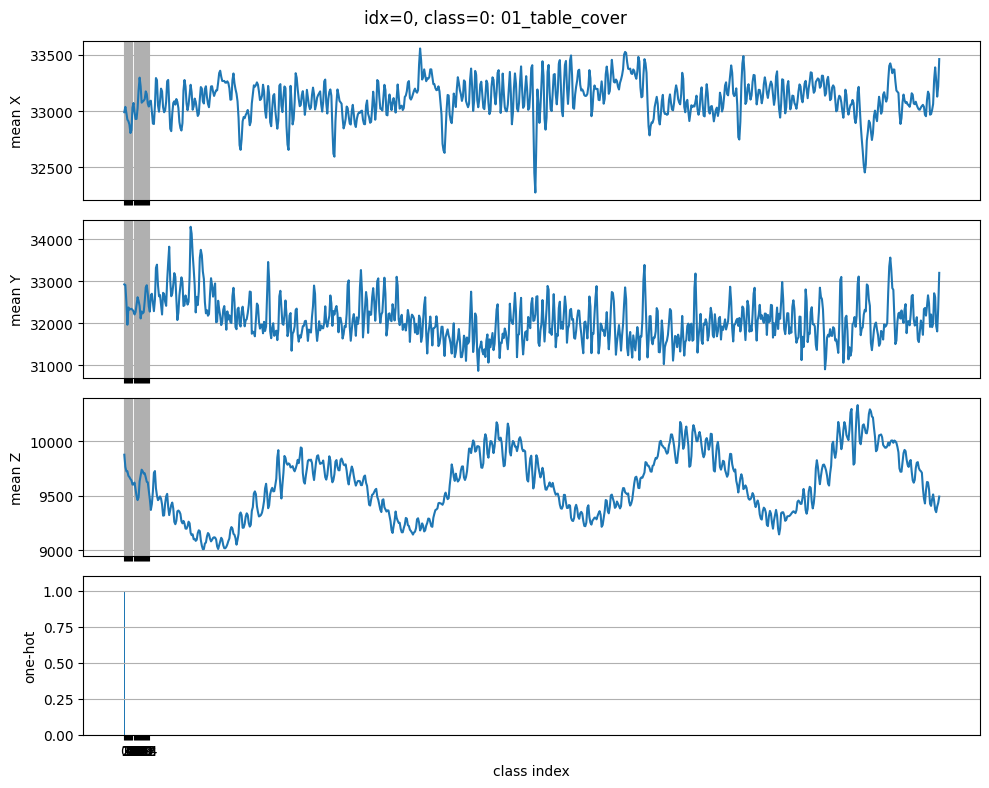

sample idx=0
  class_name : 01_table_cover
  label_idx  : 0
  one-hot    : [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


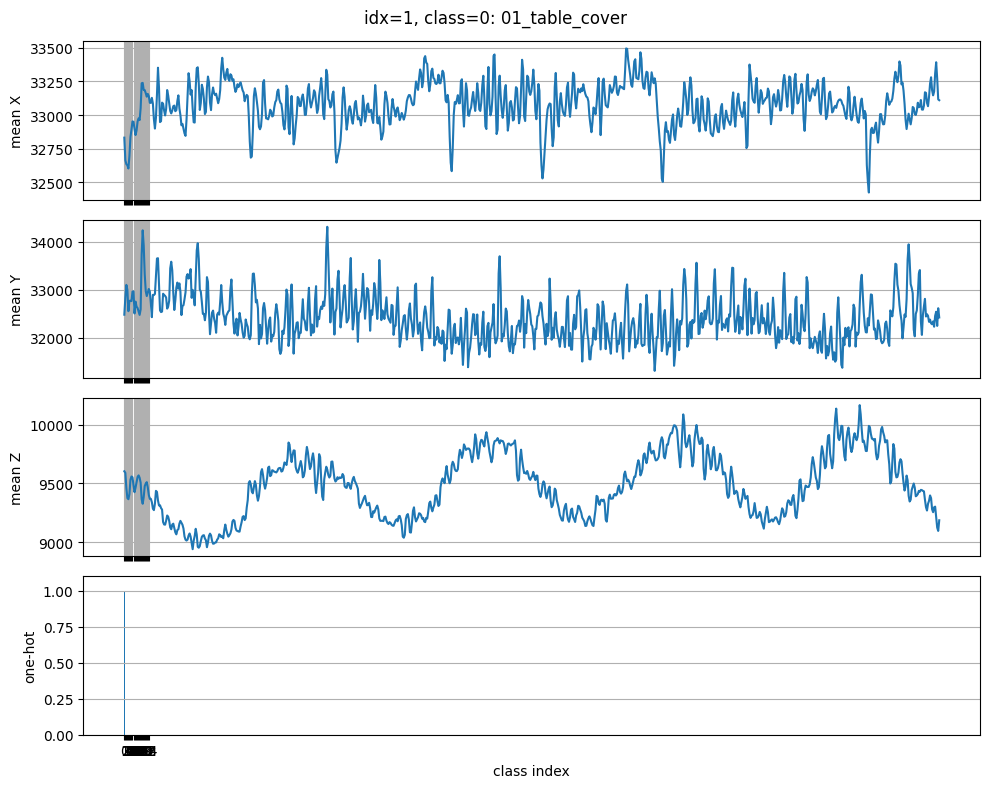

sample idx=1
  class_name : 01_table_cover
  label_idx  : 0
  one-hot    : [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


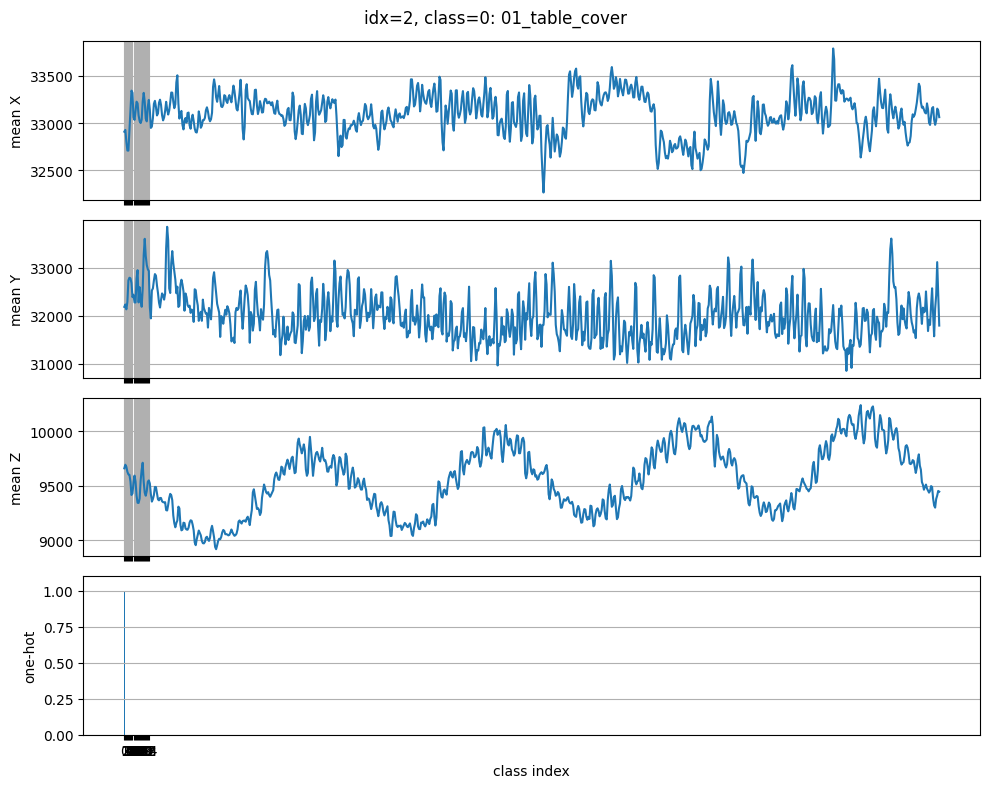

sample idx=2
  class_name : 01_table_cover
  label_idx  : 0
  one-hot    : [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]

===== class 1: 02_fur_scarf =====


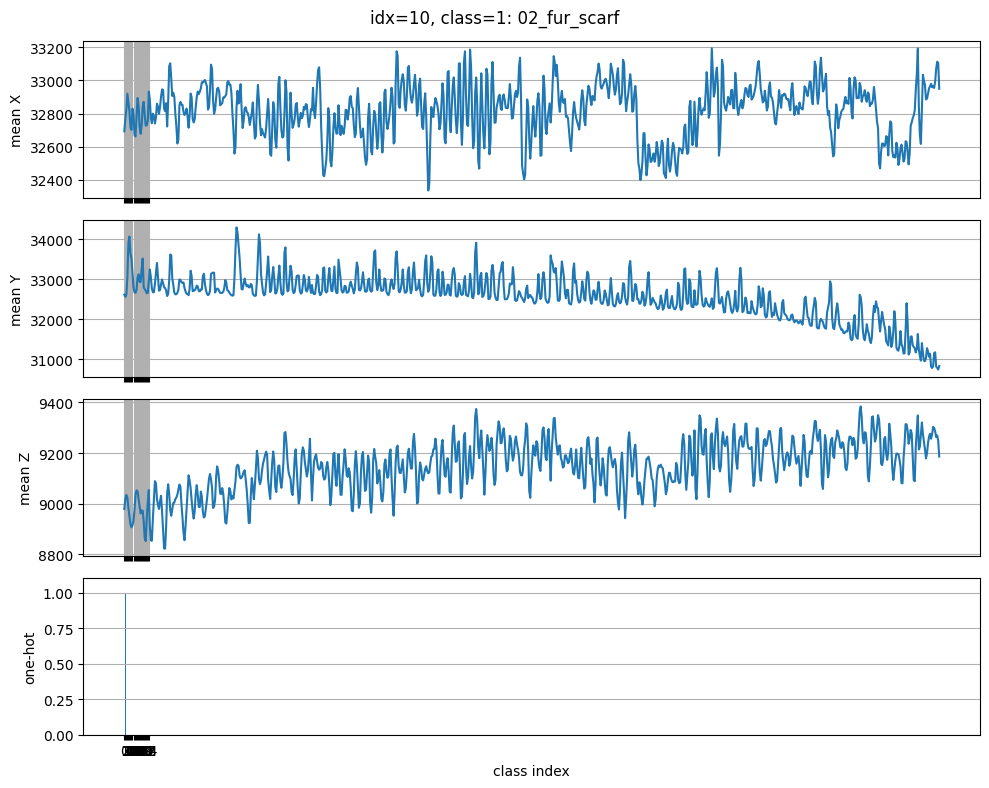

sample idx=10
  class_name : 02_fur_scarf
  label_idx  : 1
  one-hot    : [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


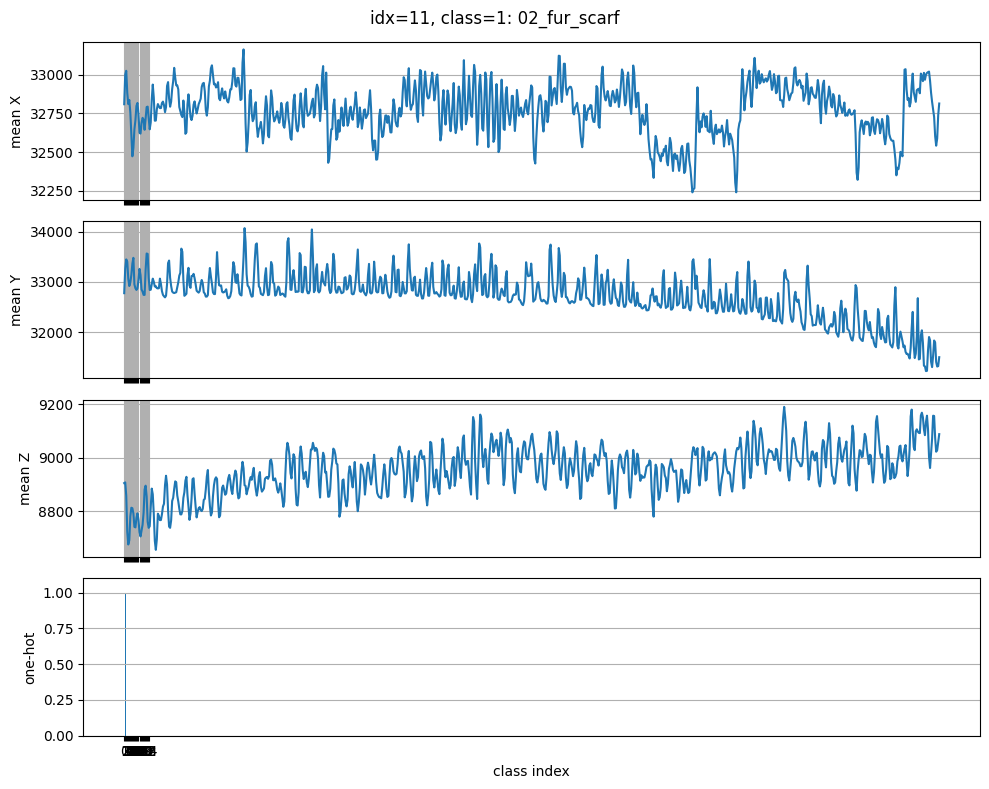

sample idx=11
  class_name : 02_fur_scarf
  label_idx  : 1
  one-hot    : [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


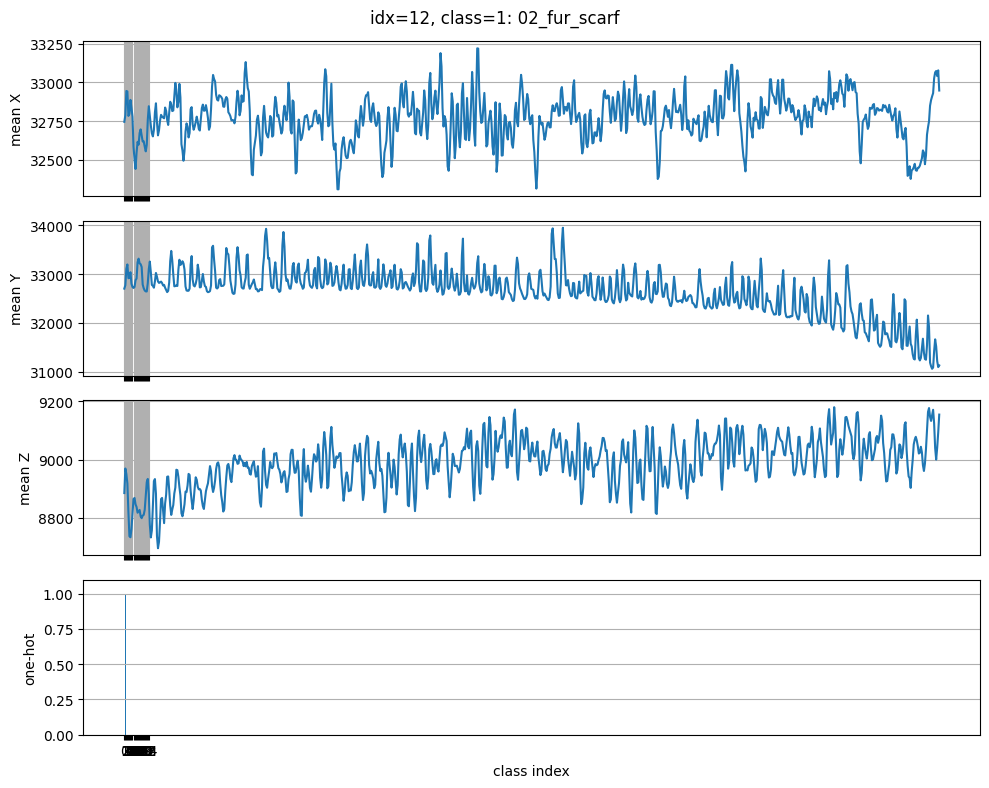

sample idx=12
  class_name : 02_fur_scarf
  label_idx  : 1
  one-hot    : [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]

===== class 2: 03_washing_towel =====


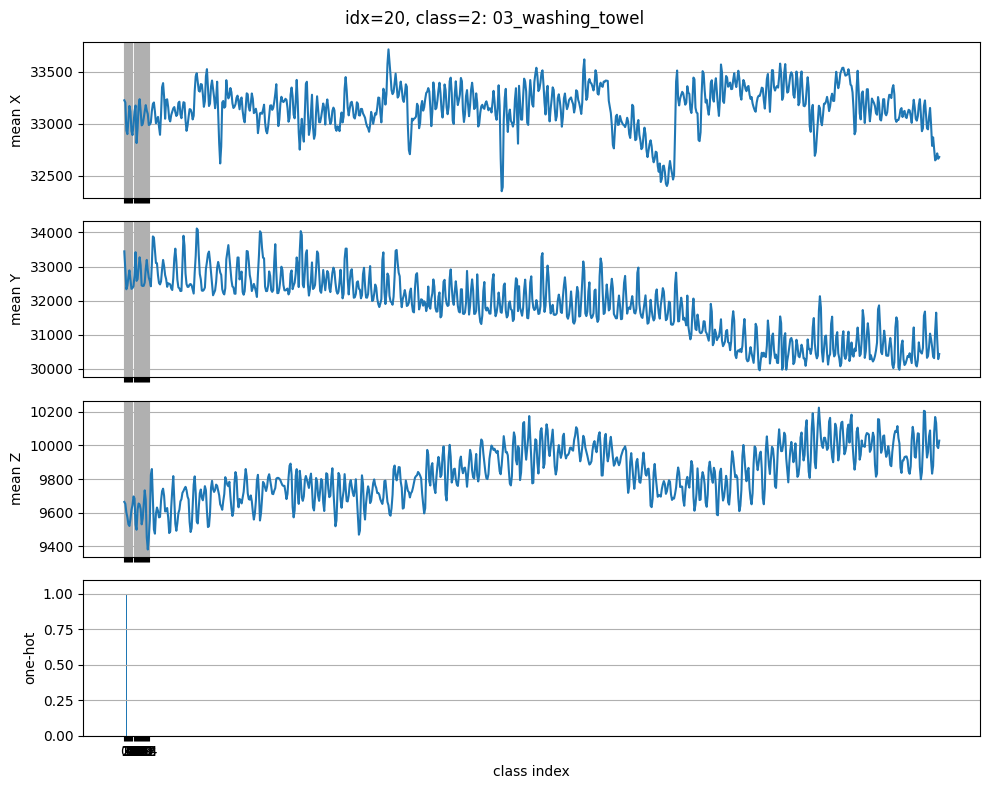

sample idx=20
  class_name : 03_washing_towel
  label_idx  : 2
  one-hot    : [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


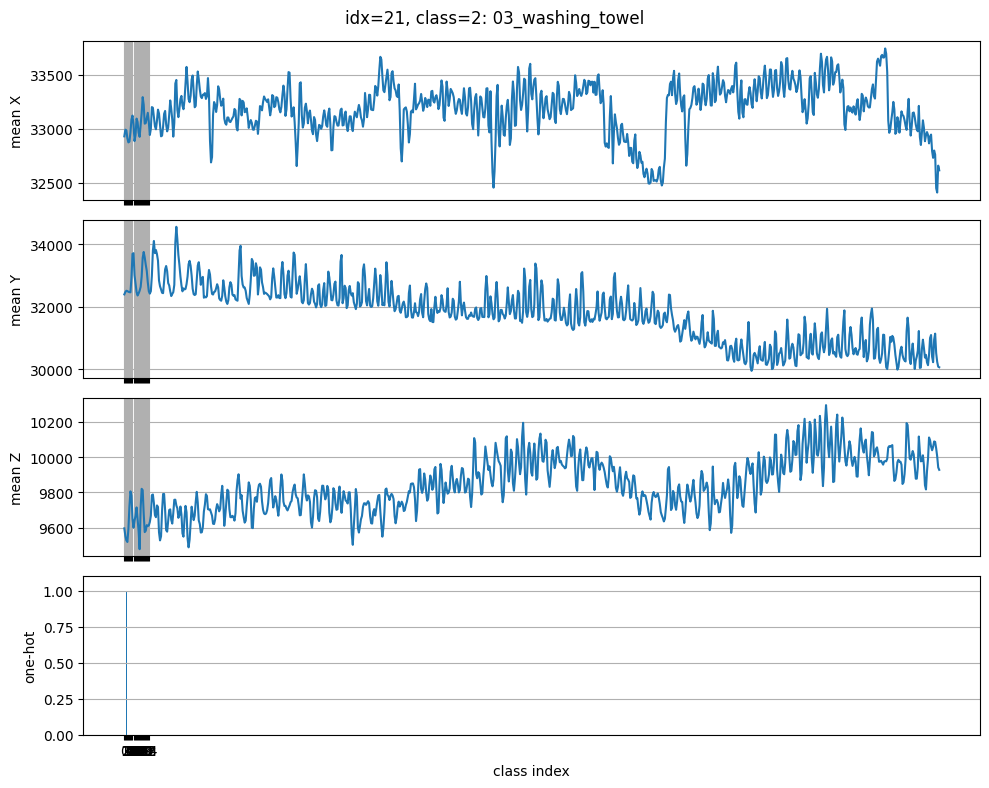

sample idx=21
  class_name : 03_washing_towel
  label_idx  : 2
  one-hot    : [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


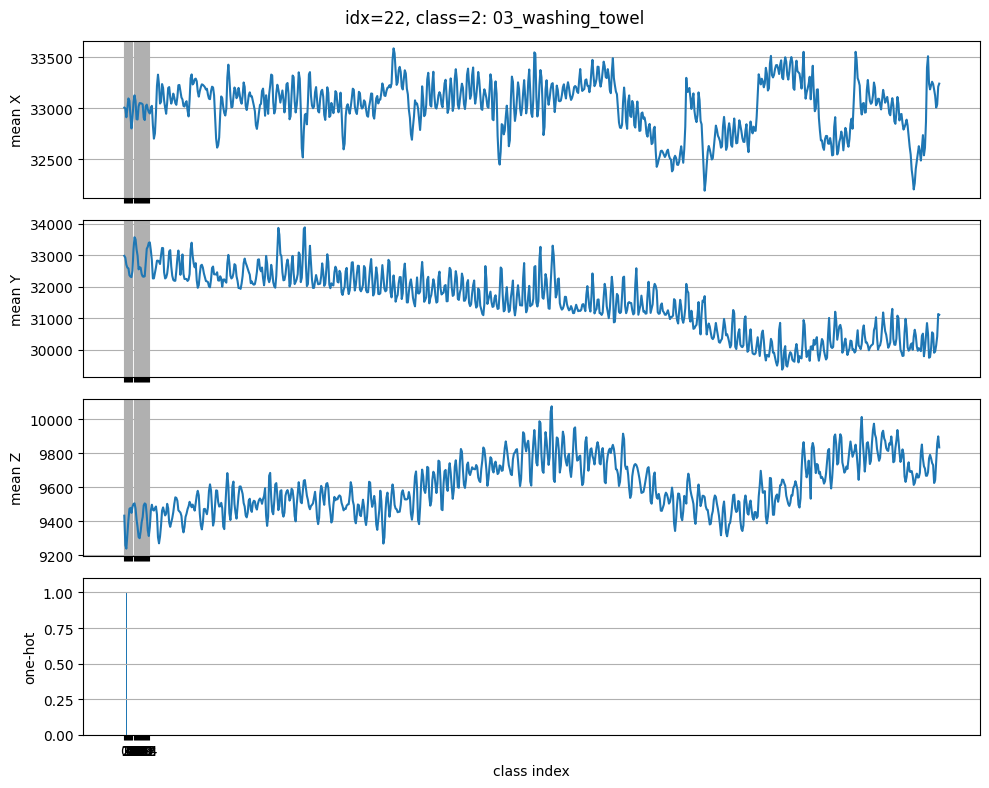

sample idx=22
  class_name : 03_washing_towel
  label_idx  : 2
  one-hot    : [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]

===== class 3: 04_carpet1 =====


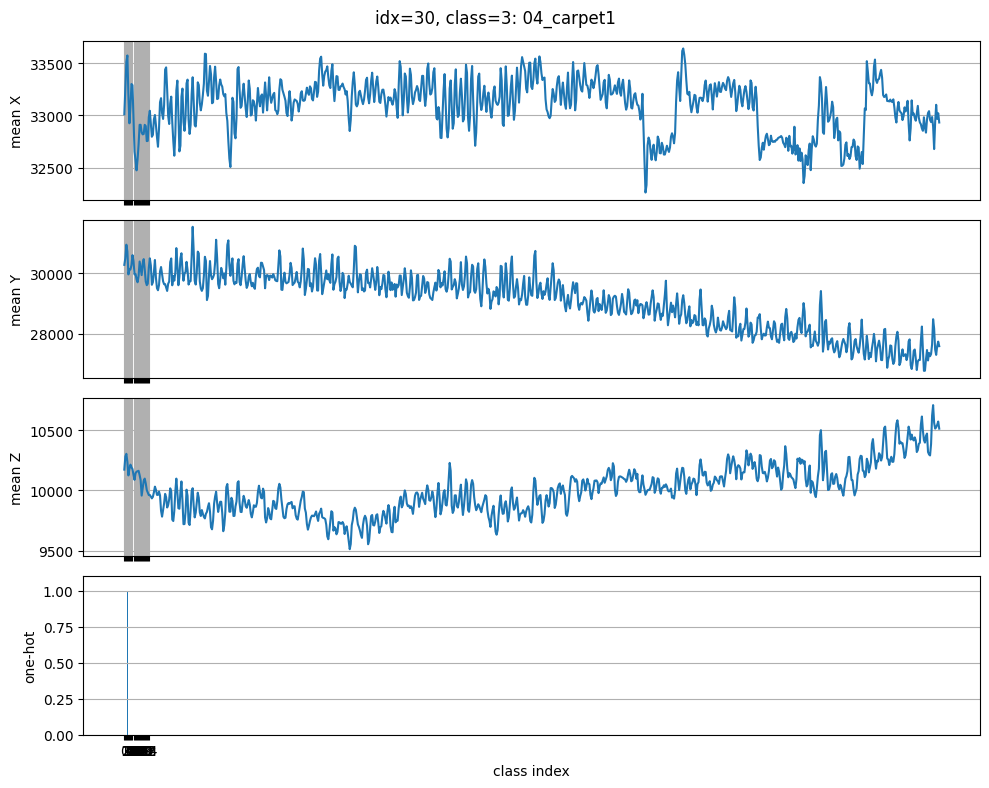

sample idx=30
  class_name : 04_carpet1
  label_idx  : 3
  one-hot    : [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


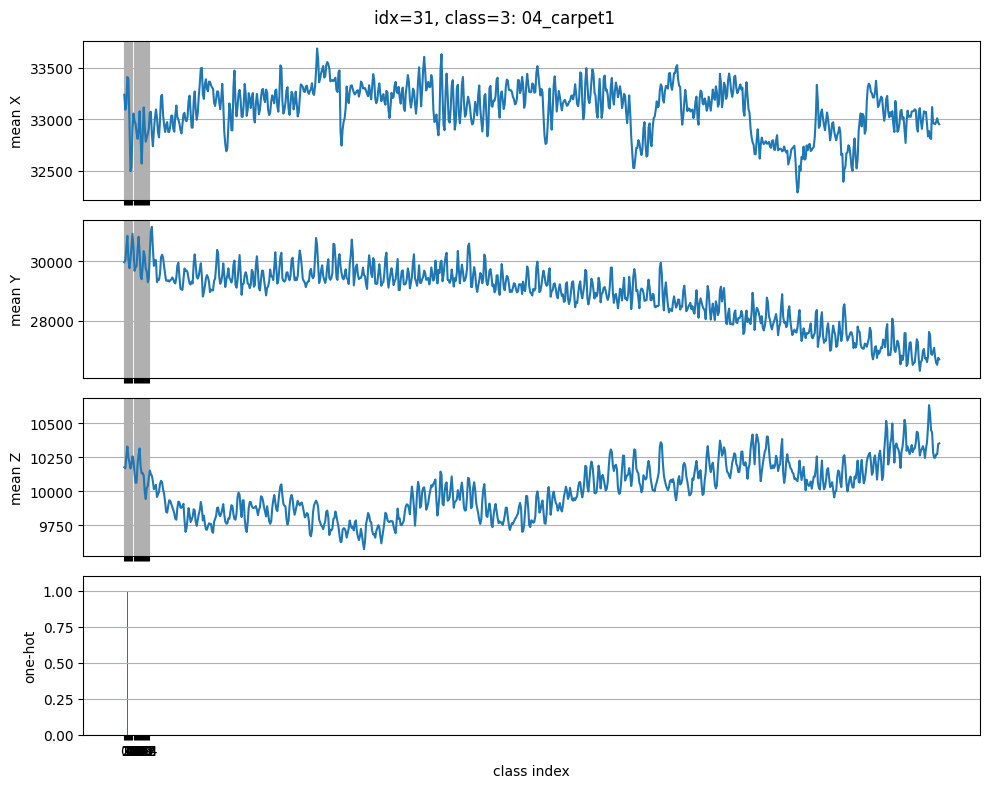

sample idx=31
  class_name : 04_carpet1
  label_idx  : 3
  one-hot    : [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


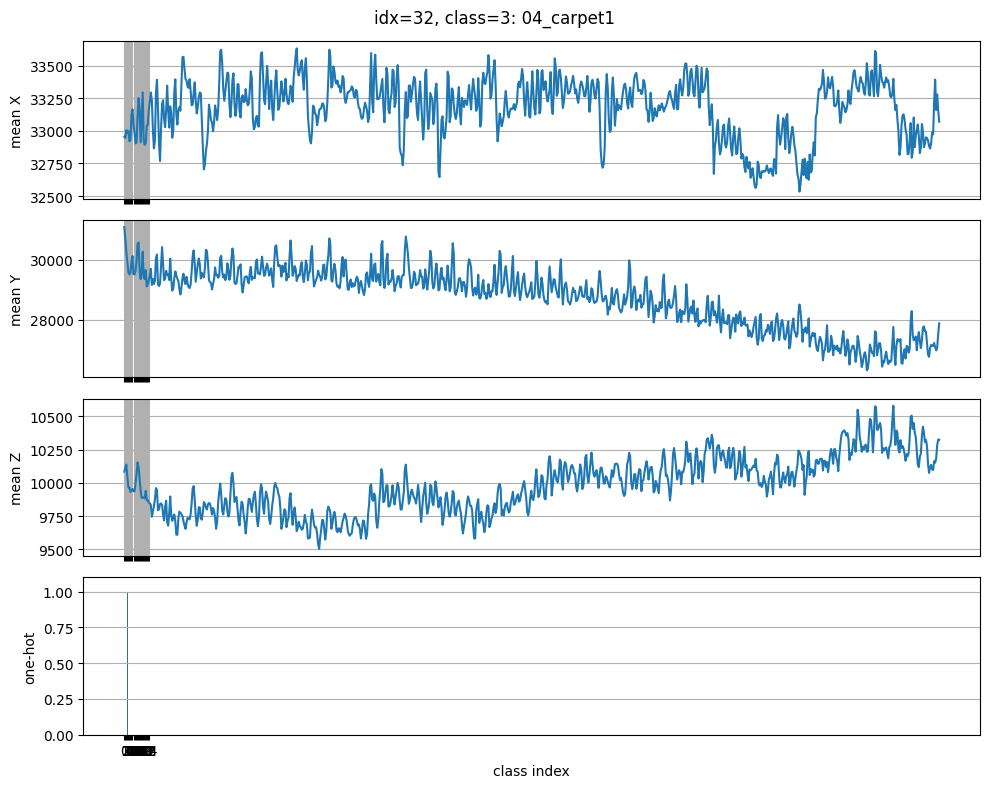

sample idx=32
  class_name : 04_carpet1
  label_idx  : 3
  one-hot    : [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]

===== class 4: 05_bubble_wrap =====


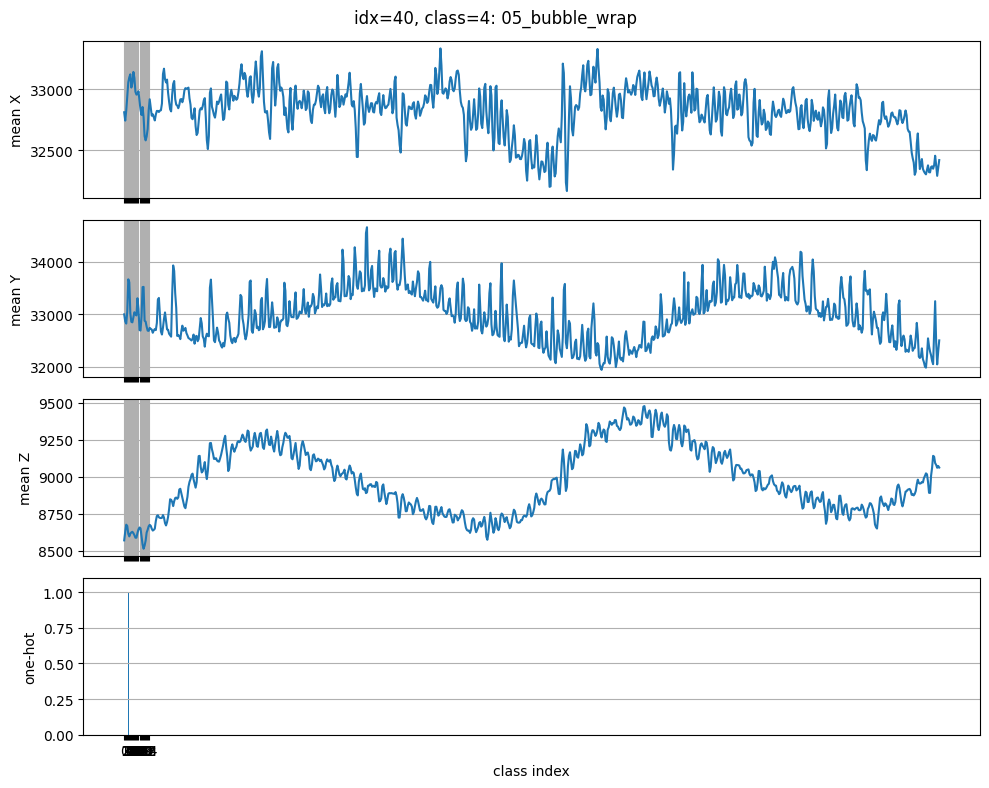

sample idx=40
  class_name : 05_bubble_wrap
  label_idx  : 4
  one-hot    : [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


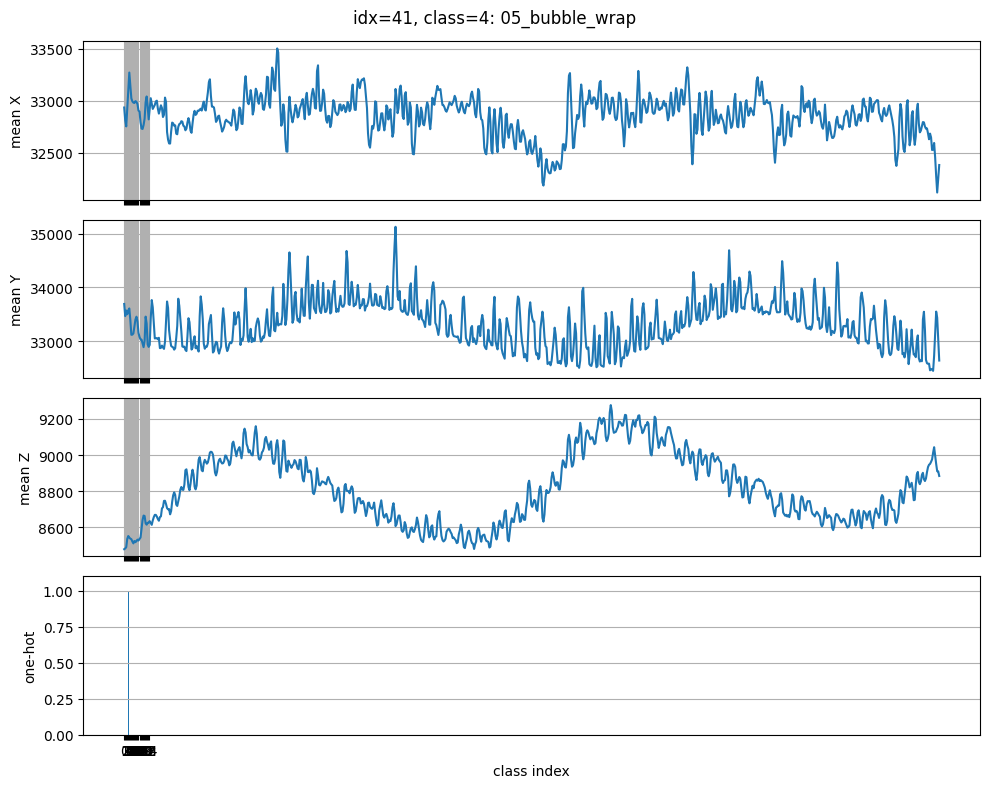

sample idx=41
  class_name : 05_bubble_wrap
  label_idx  : 4
  one-hot    : [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


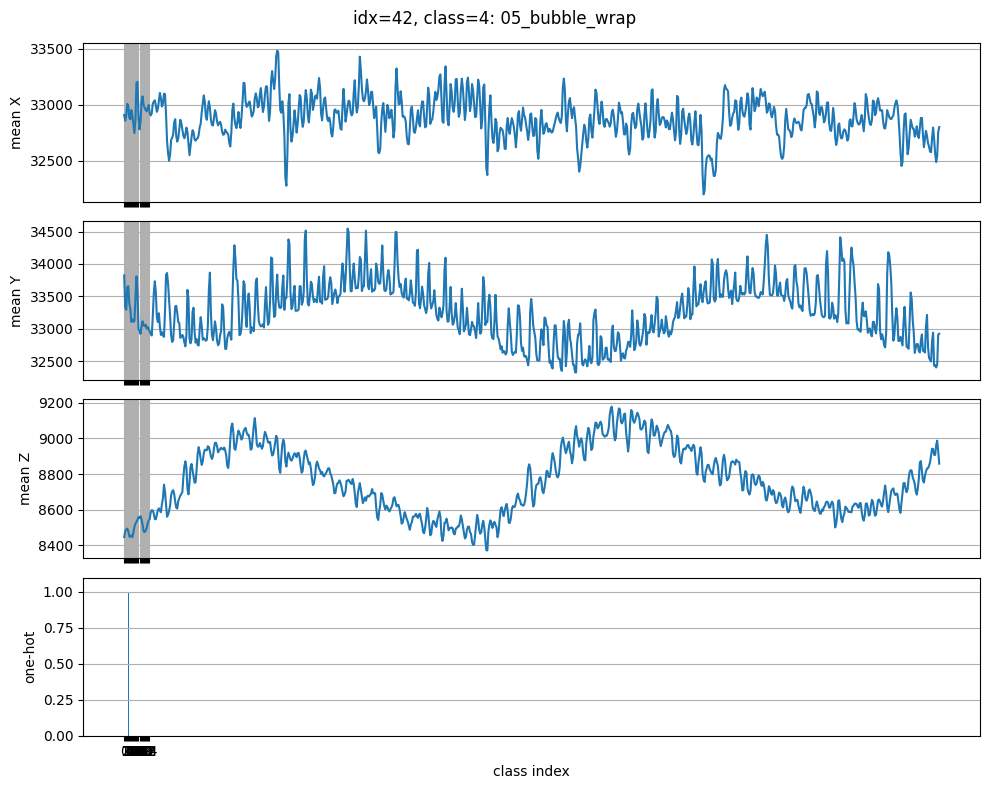

sample idx=42
  class_name : 05_bubble_wrap
  label_idx  : 4
  one-hot    : [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]

===== class 5: 06_fleece_scarf =====


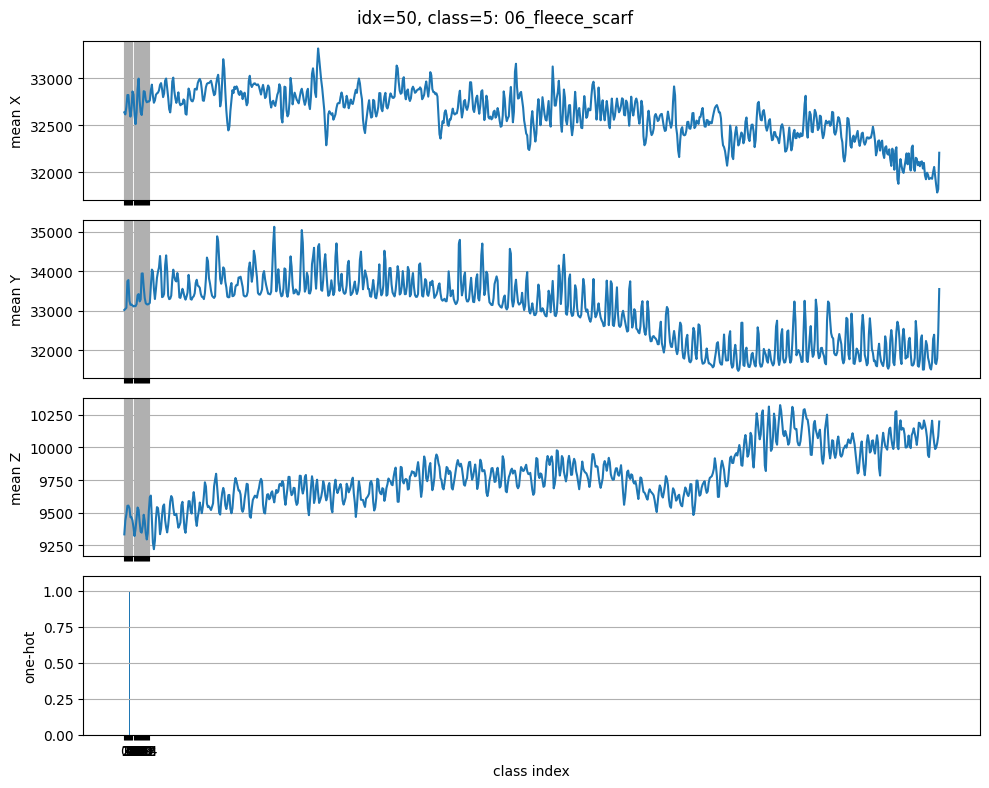

sample idx=50
  class_name : 06_fleece_scarf
  label_idx  : 5
  one-hot    : [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


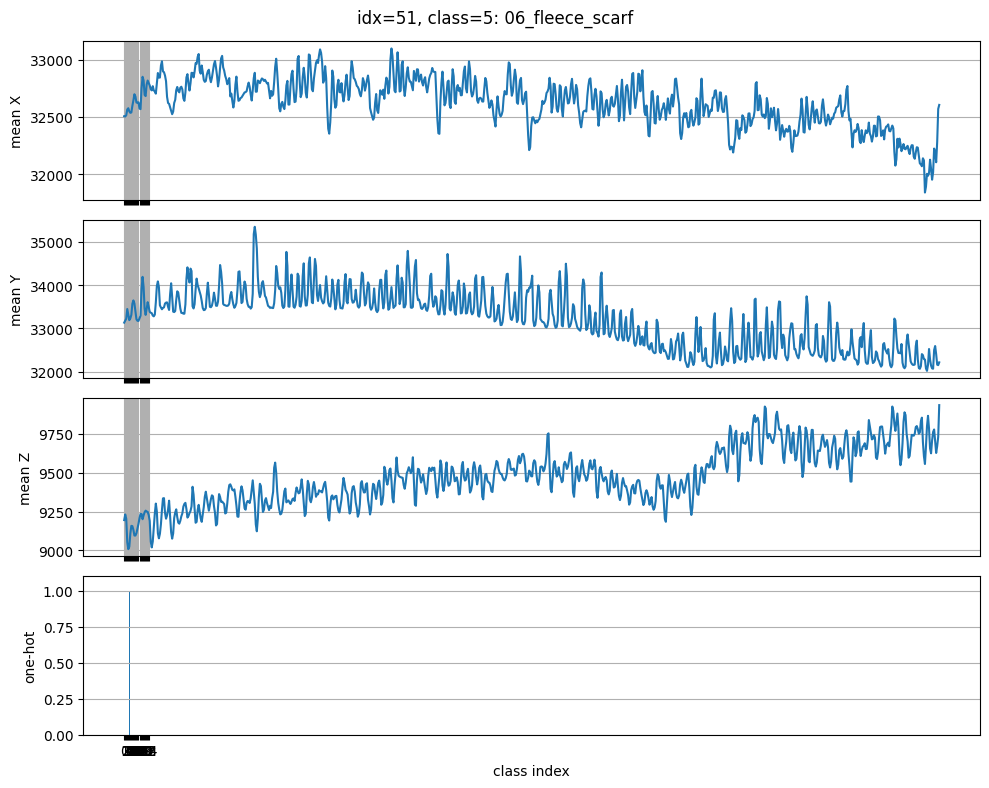

sample idx=51
  class_name : 06_fleece_scarf
  label_idx  : 5
  one-hot    : [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


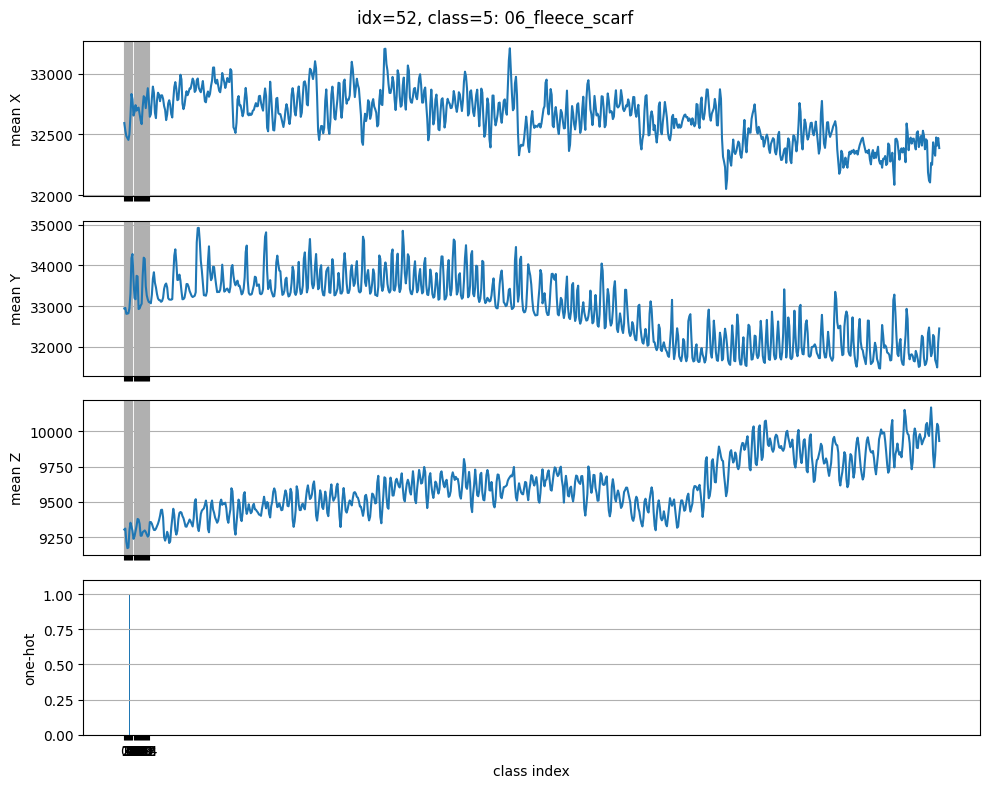

sample idx=52
  class_name : 06_fleece_scarf
  label_idx  : 5
  one-hot    : [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]

===== class 6: 07_knit_hat1 =====


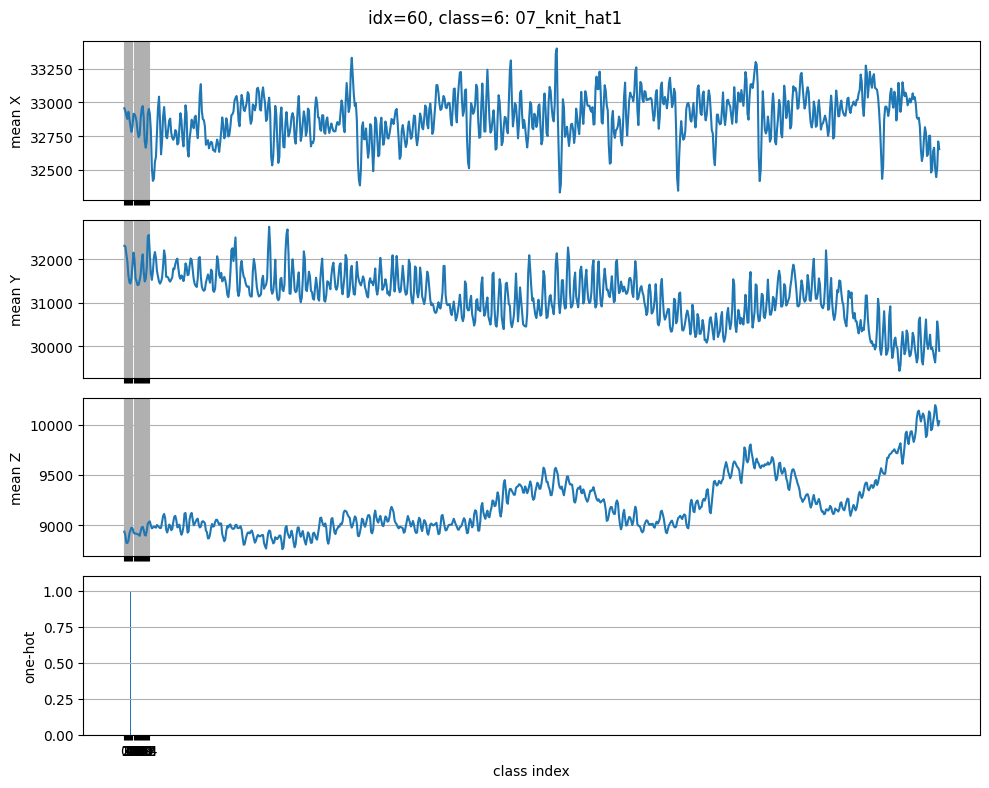

sample idx=60
  class_name : 07_knit_hat1
  label_idx  : 6
  one-hot    : [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


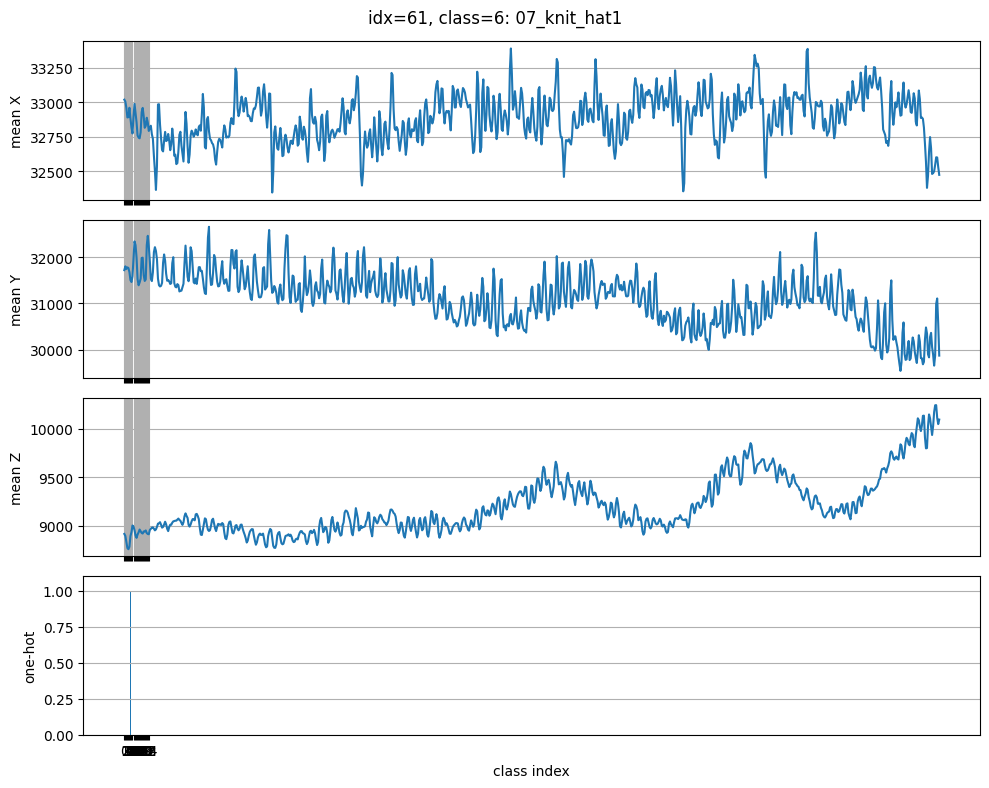

sample idx=61
  class_name : 07_knit_hat1
  label_idx  : 6
  one-hot    : [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


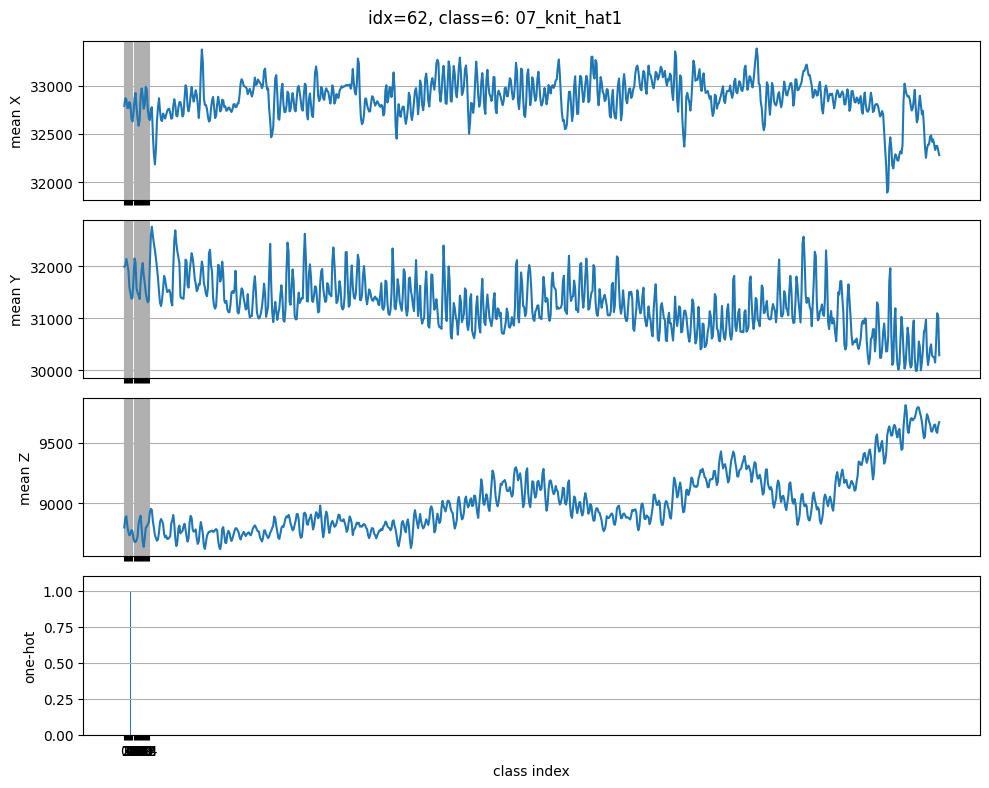

sample idx=62
  class_name : 07_knit_hat1
  label_idx  : 6
  one-hot    : [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]

===== class 7: 08_body_towel1 =====


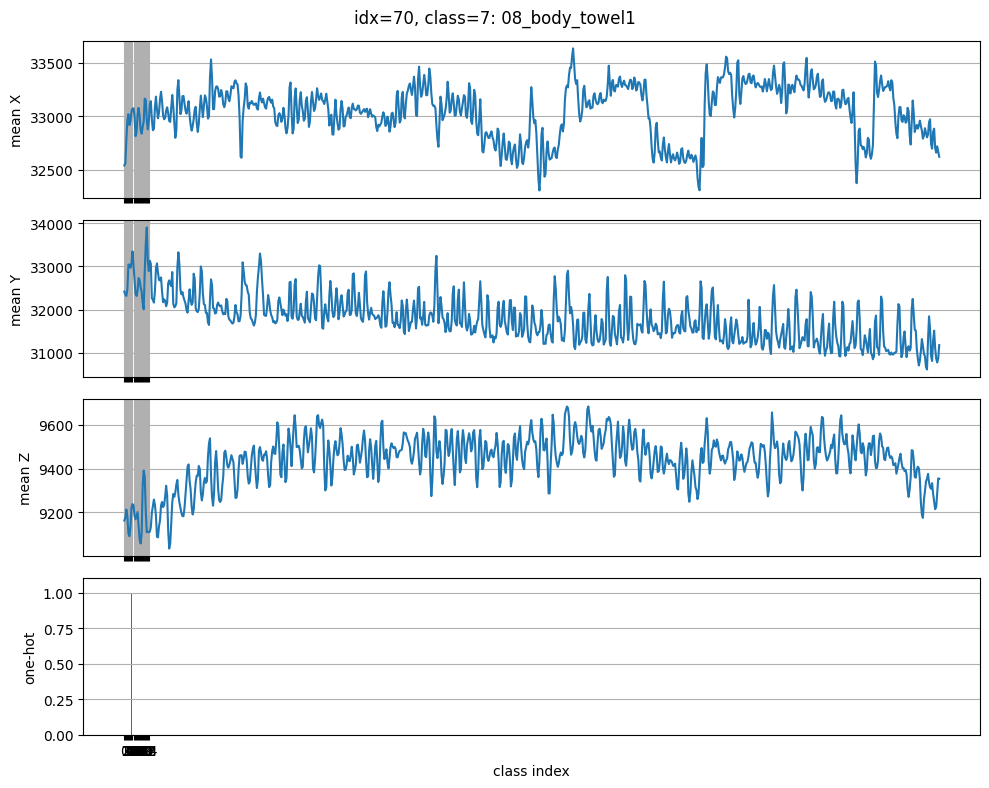

sample idx=70
  class_name : 08_body_towel1
  label_idx  : 7
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


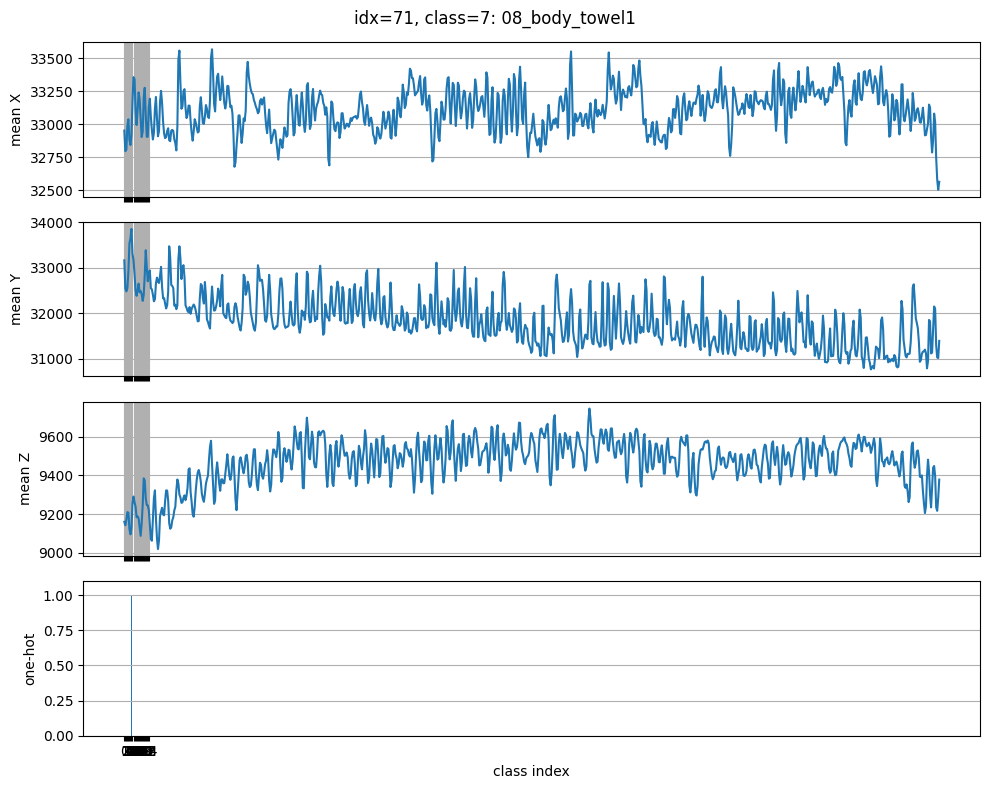

sample idx=71
  class_name : 08_body_towel1
  label_idx  : 7
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


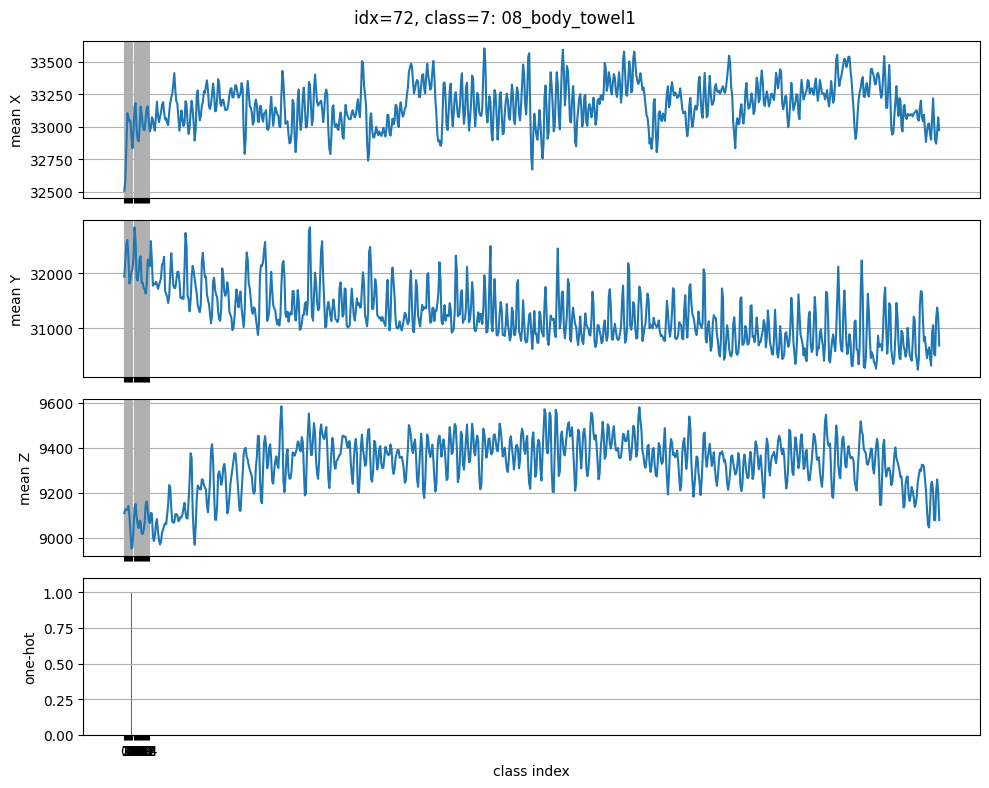

sample idx=72
  class_name : 08_body_towel1
  label_idx  : 7
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]

===== class 8: 09_body_towel2 =====


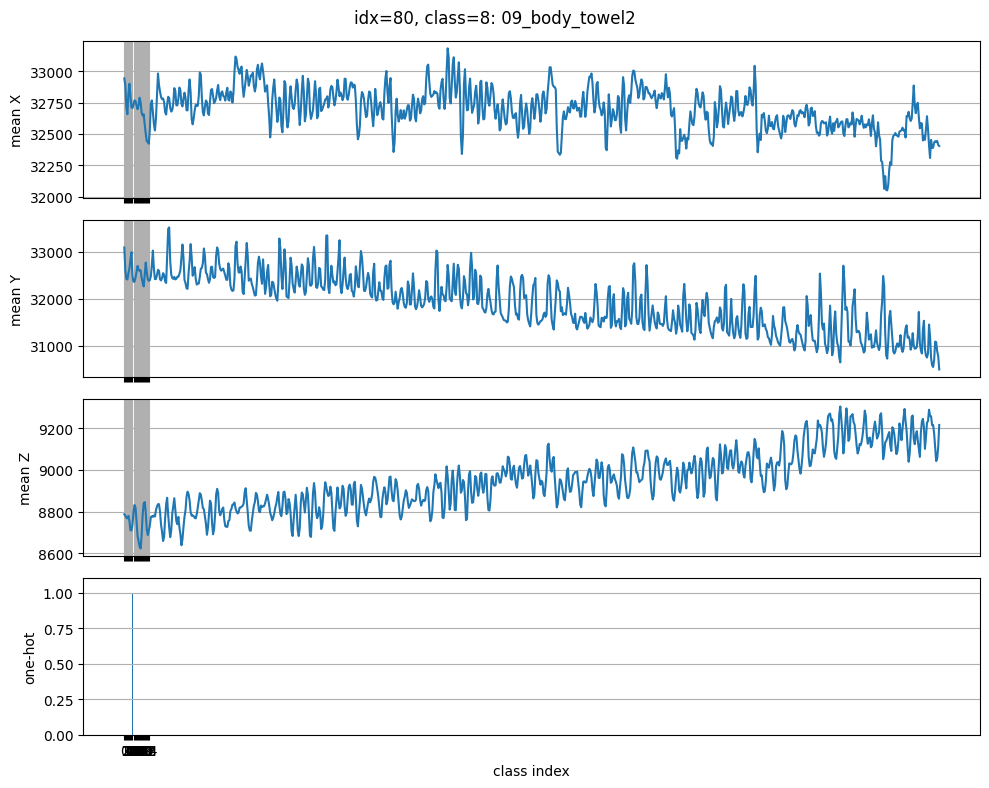

sample idx=80
  class_name : 09_body_towel2
  label_idx  : 8
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


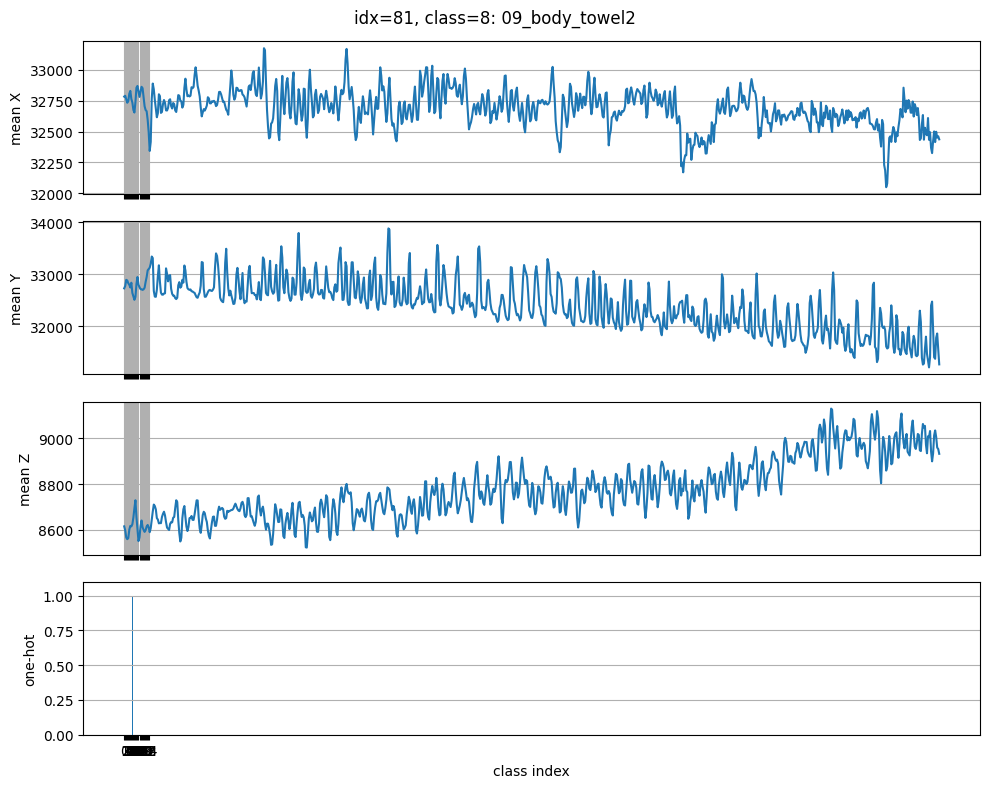

sample idx=81
  class_name : 09_body_towel2
  label_idx  : 8
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


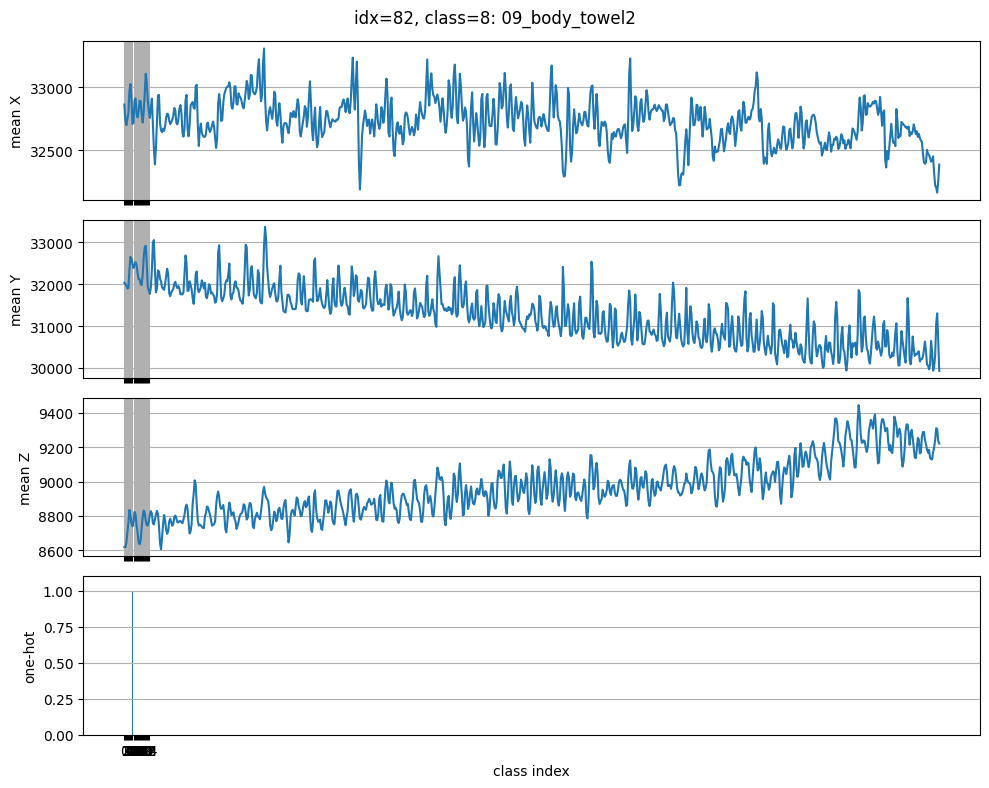

sample idx=82
  class_name : 09_body_towel2
  label_idx  : 8
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]

===== class 9: 10_carpet2 =====


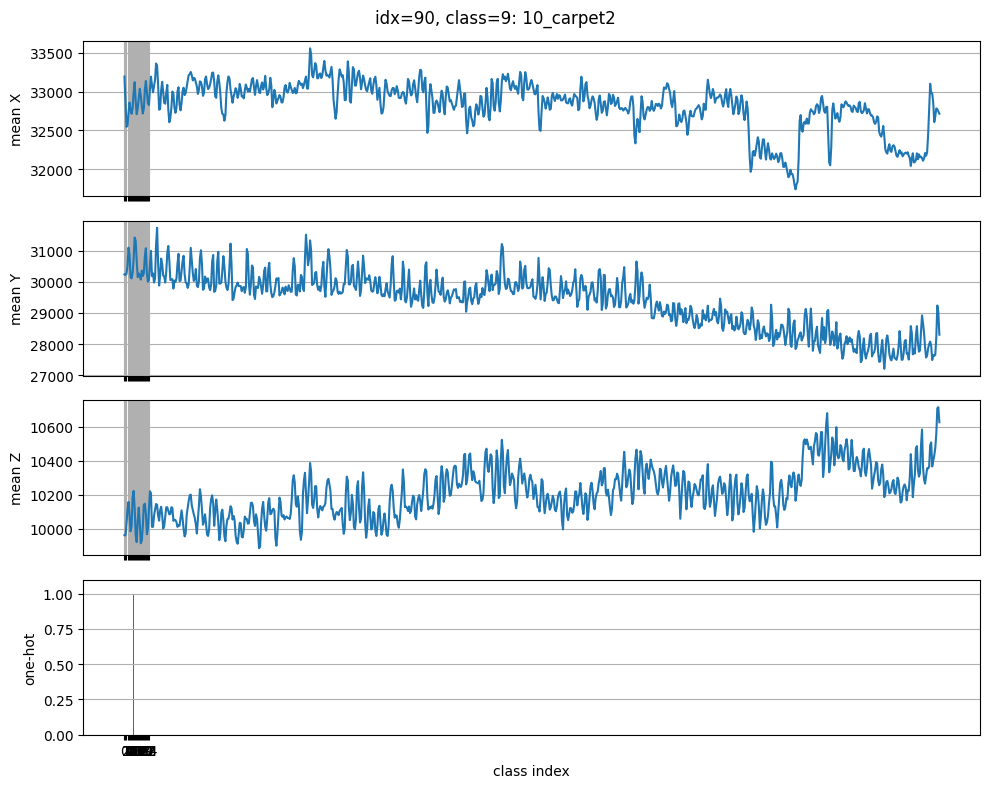

sample idx=90
  class_name : 10_carpet2
  label_idx  : 9
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


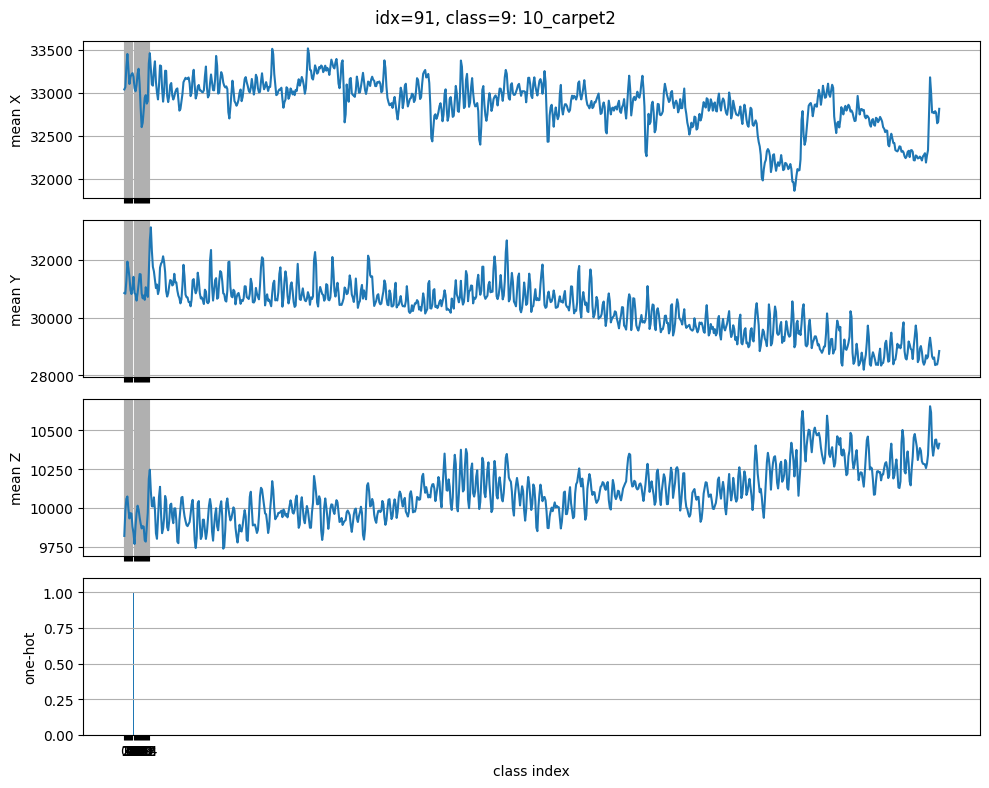

sample idx=91
  class_name : 10_carpet2
  label_idx  : 9
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


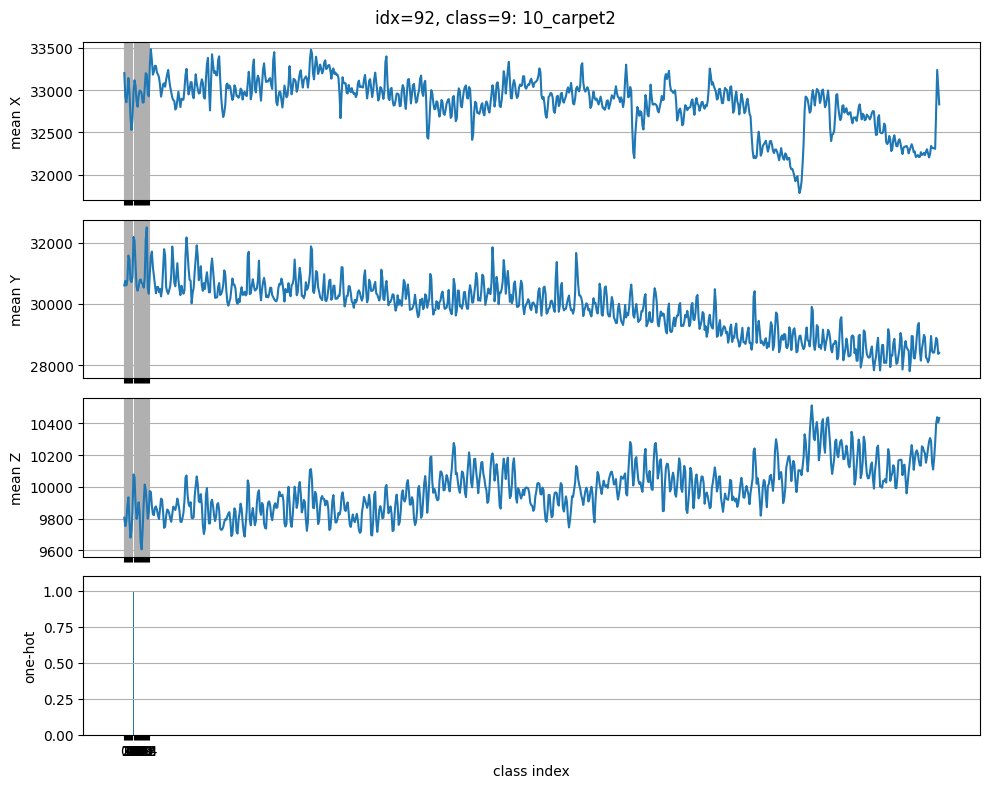

sample idx=92
  class_name : 10_carpet2
  label_idx  : 9
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]

===== class 10: 11_work_gloves =====


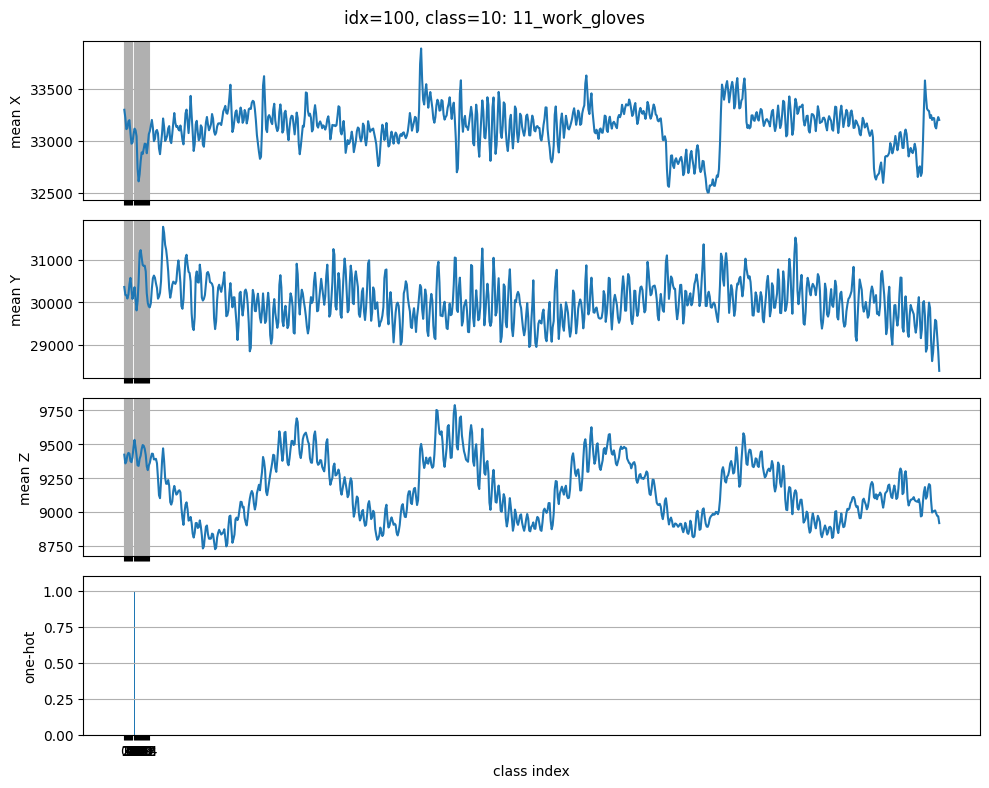

sample idx=100
  class_name : 11_work_gloves
  label_idx  : 10
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


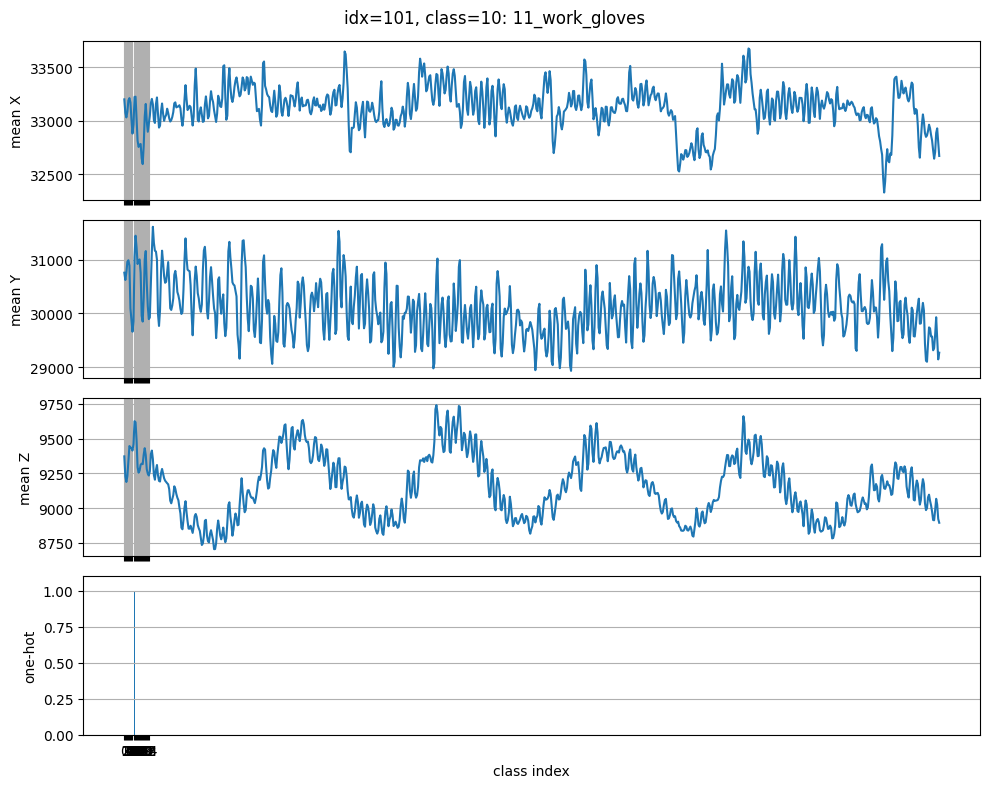

sample idx=101
  class_name : 11_work_gloves
  label_idx  : 10
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


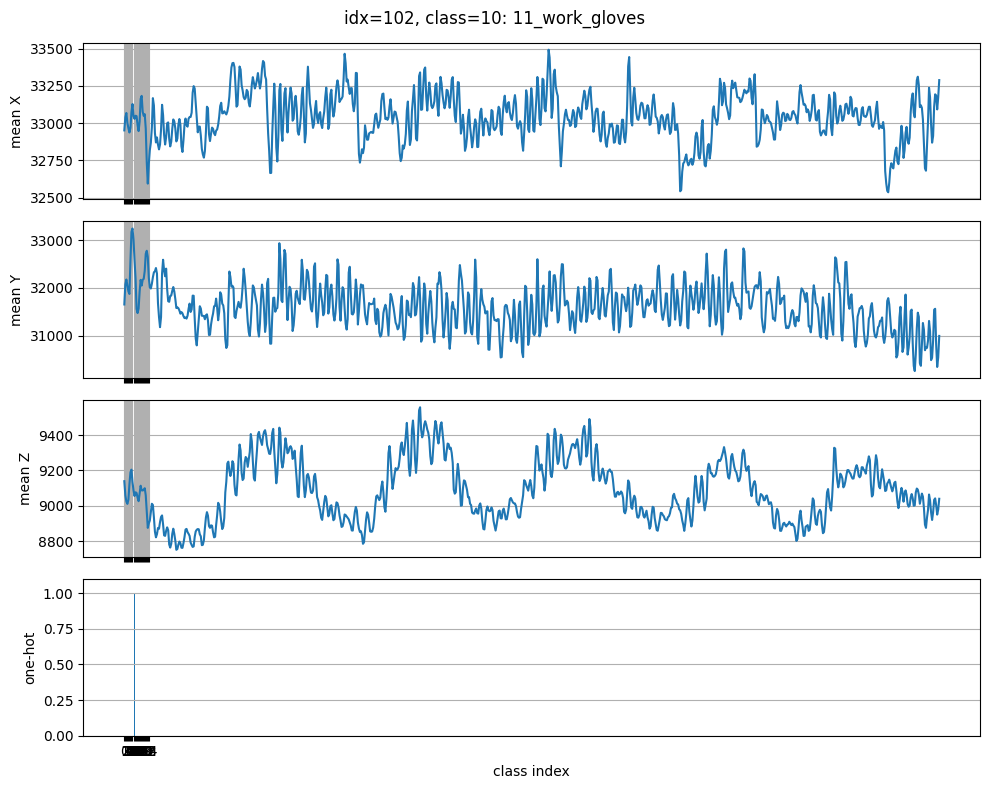

sample idx=102
  class_name : 11_work_gloves
  label_idx  : 10
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]

===== class 11: 12_knit_hat2 =====


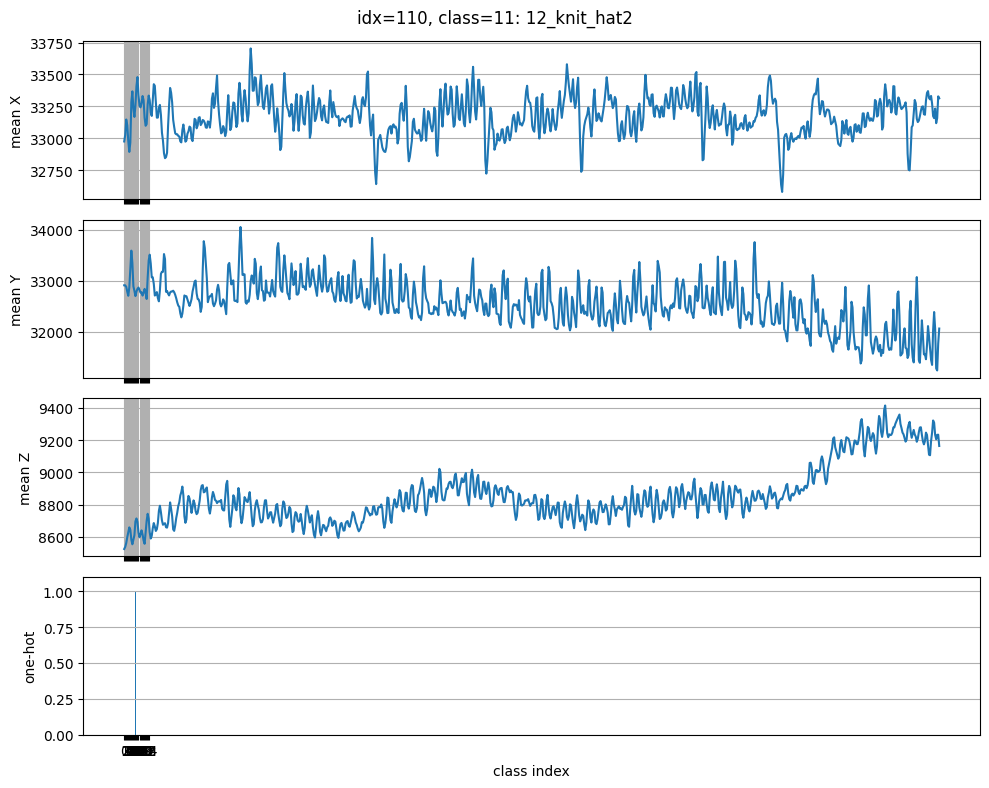

sample idx=110
  class_name : 12_knit_hat2
  label_idx  : 11
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


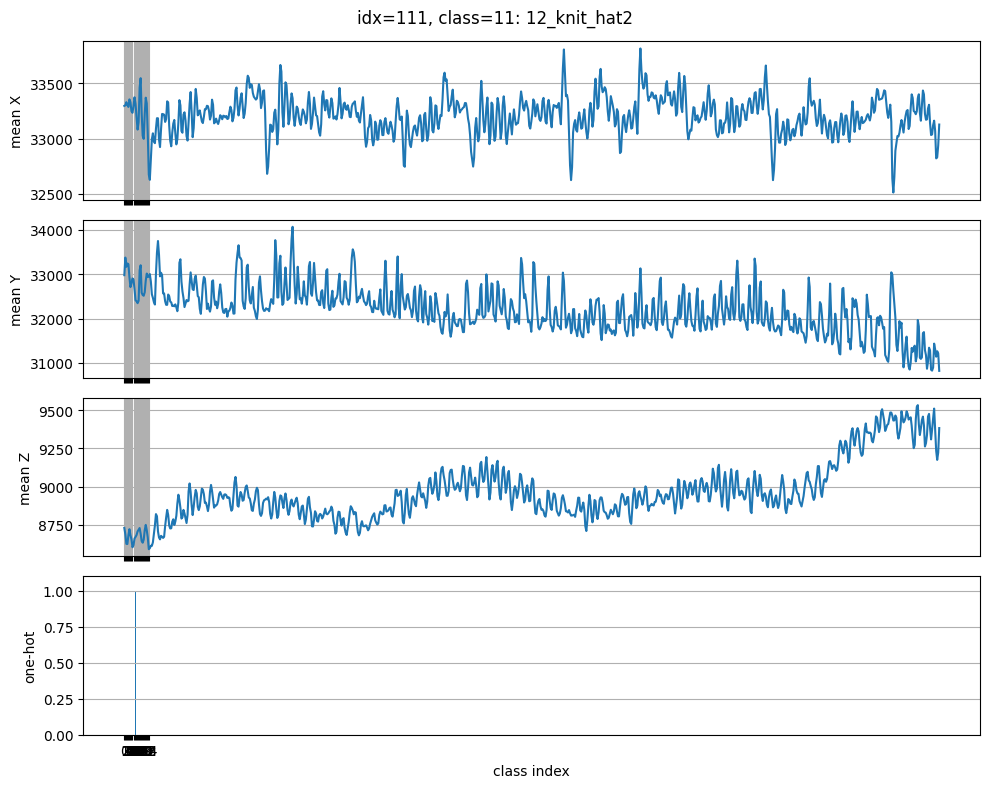

sample idx=111
  class_name : 12_knit_hat2
  label_idx  : 11
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


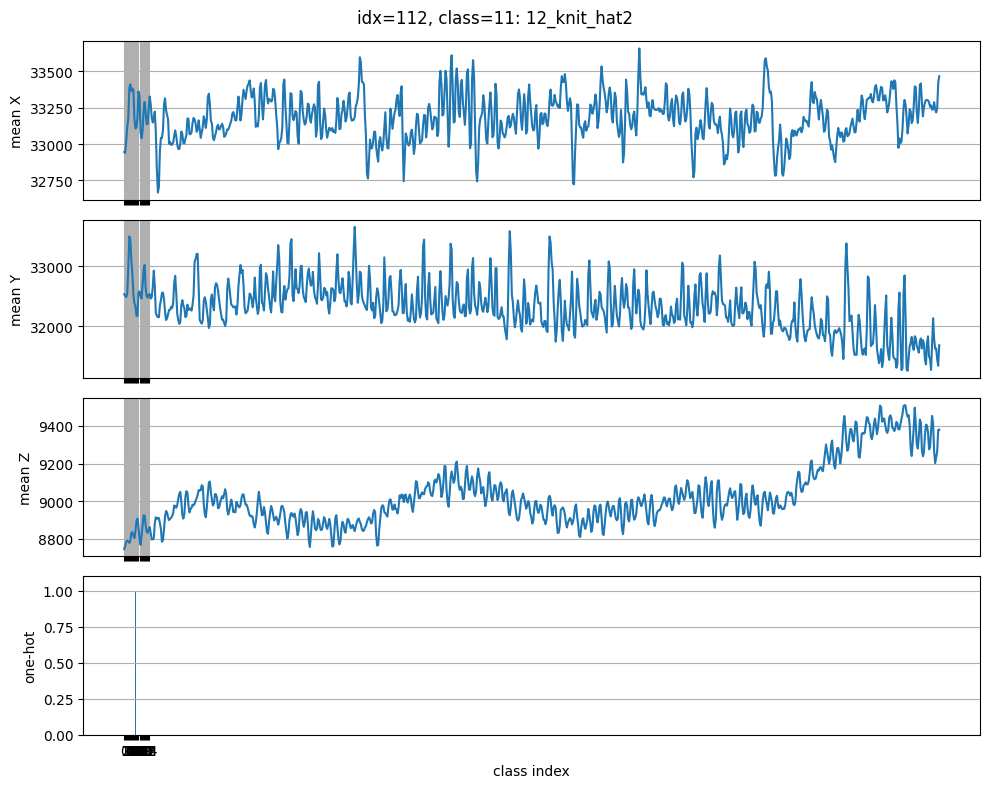

sample idx=112
  class_name : 12_knit_hat2
  label_idx  : 11
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]

===== class 12: 13_toilet_mat1 =====


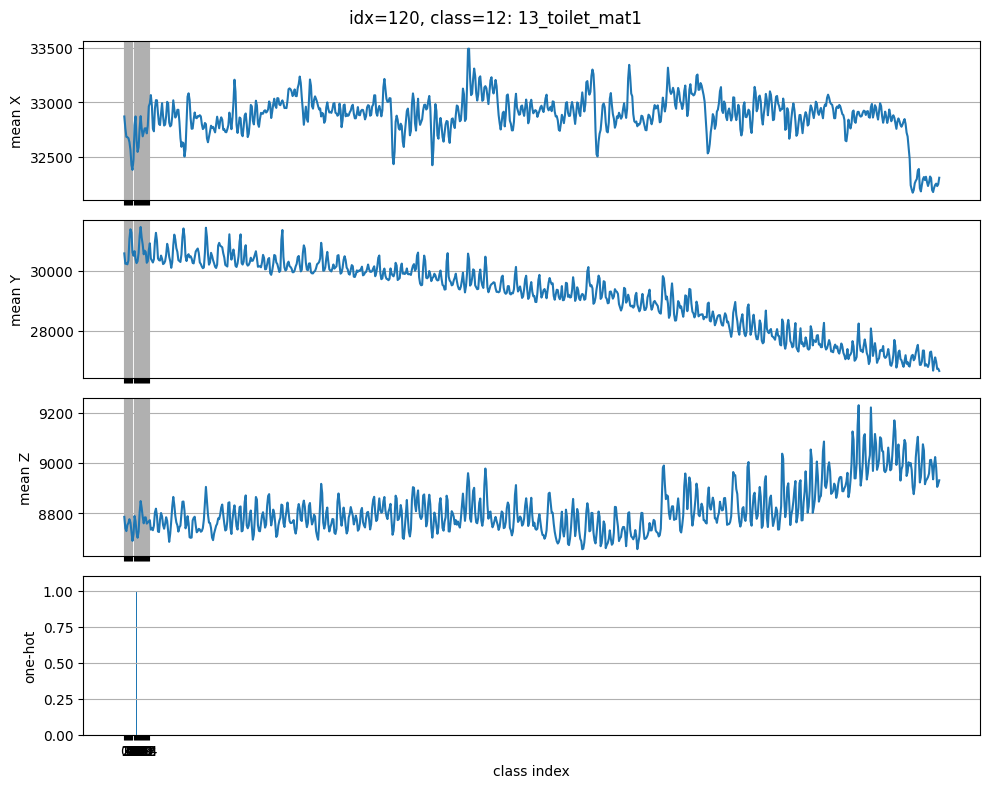

sample idx=120
  class_name : 13_toilet_mat1
  label_idx  : 12
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


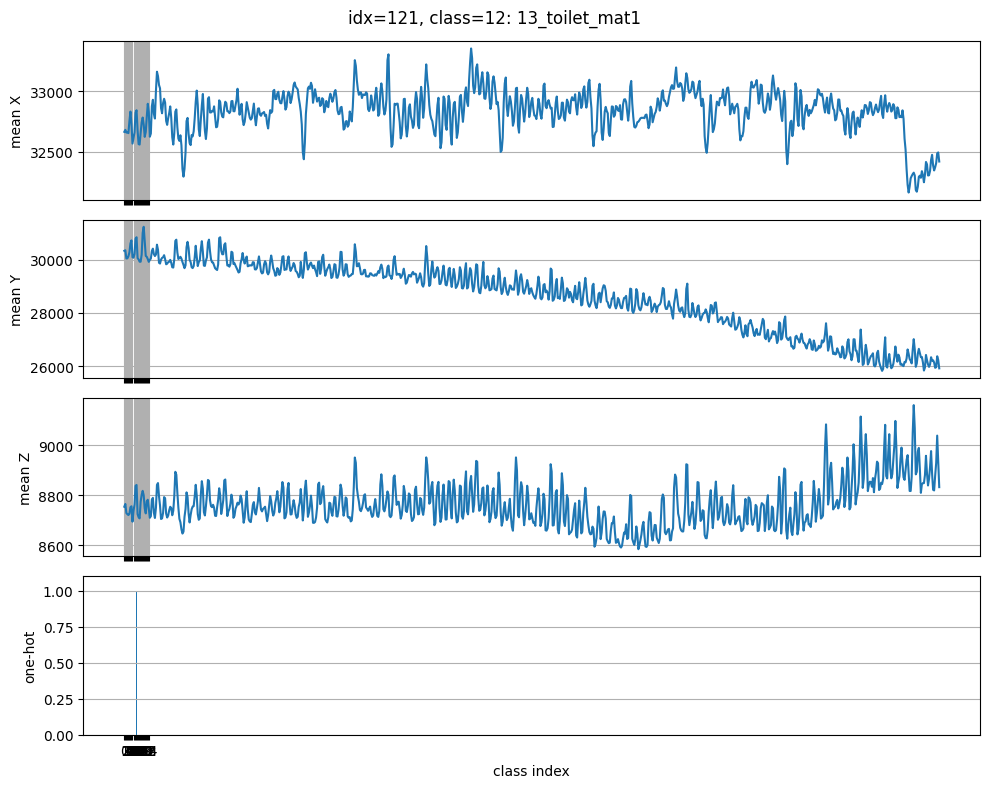

sample idx=121
  class_name : 13_toilet_mat1
  label_idx  : 12
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


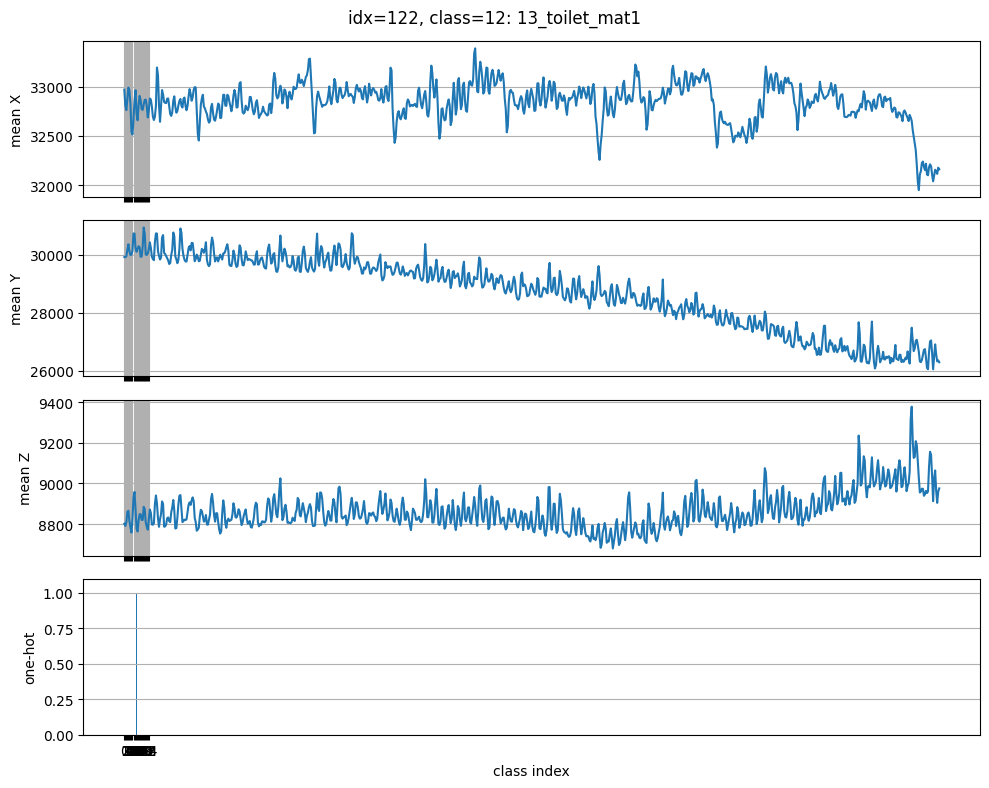

sample idx=122
  class_name : 13_toilet_mat1
  label_idx  : 12
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]

===== class 13: 14_floor_mat =====


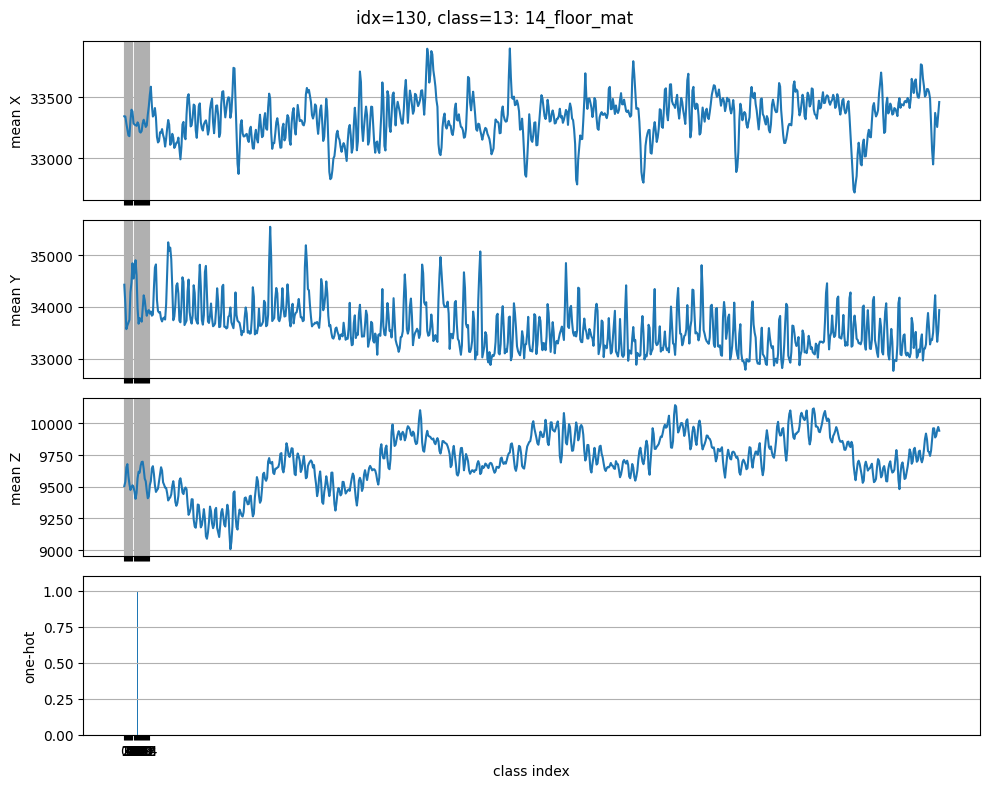

sample idx=130
  class_name : 14_floor_mat
  label_idx  : 13
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


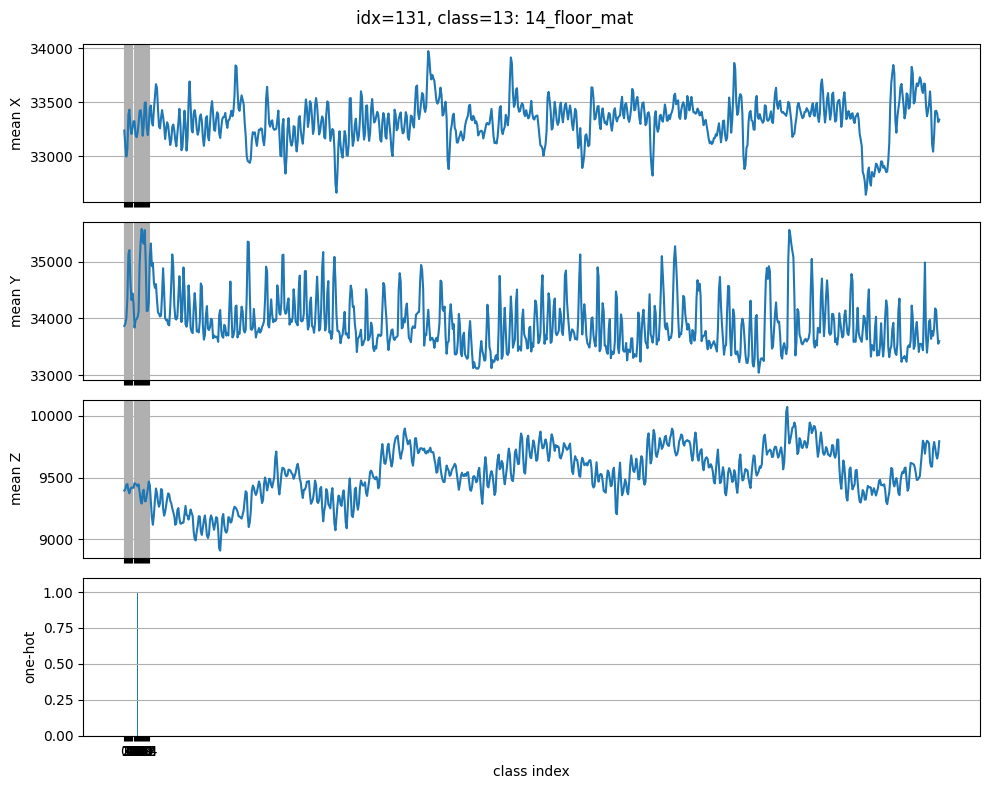

sample idx=131
  class_name : 14_floor_mat
  label_idx  : 13
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


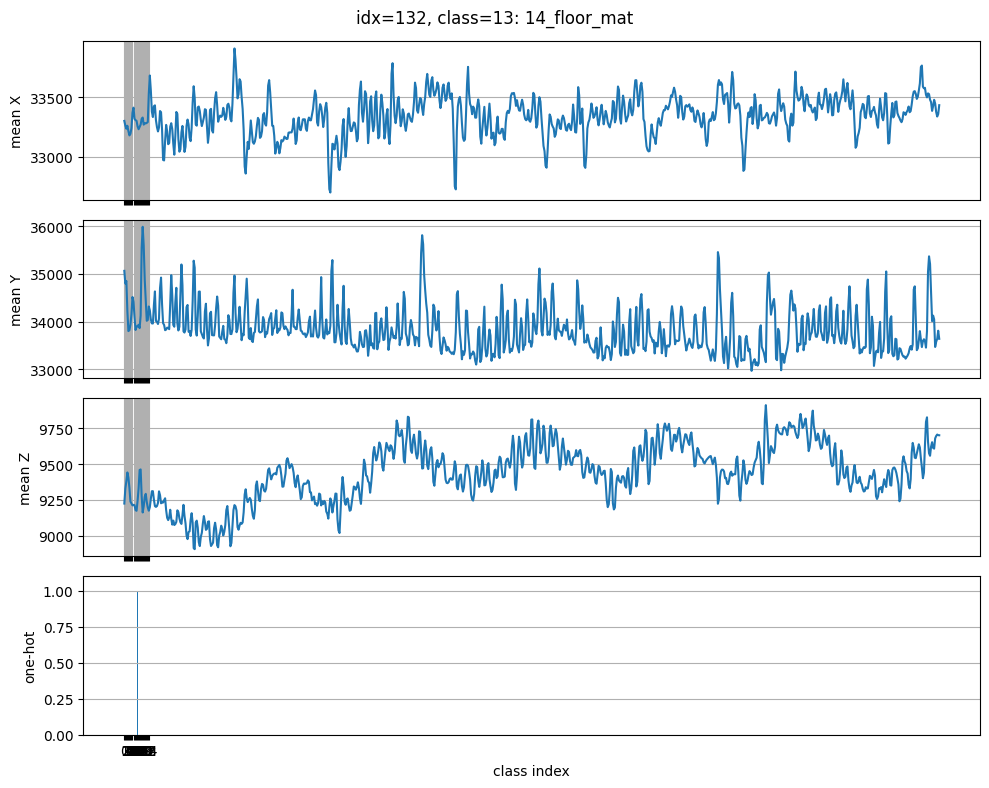

sample idx=132
  class_name : 14_floor_mat
  label_idx  : 13
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]

===== class 14: 15_sponge1 =====


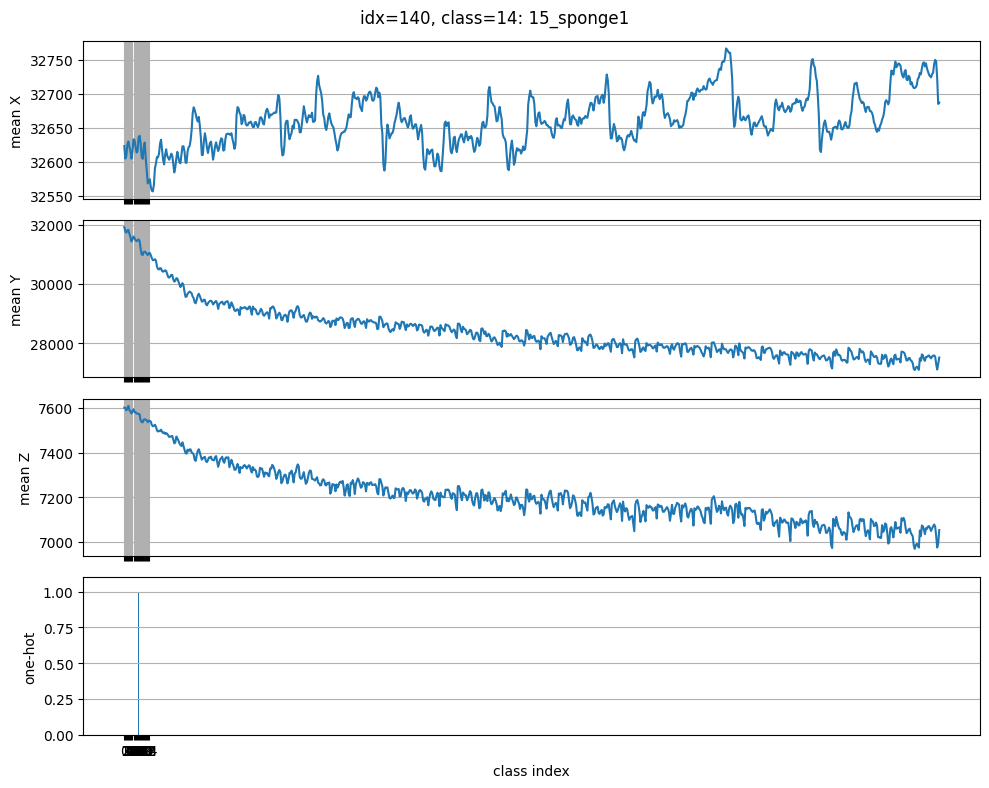

sample idx=140
  class_name : 15_sponge1
  label_idx  : 14
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


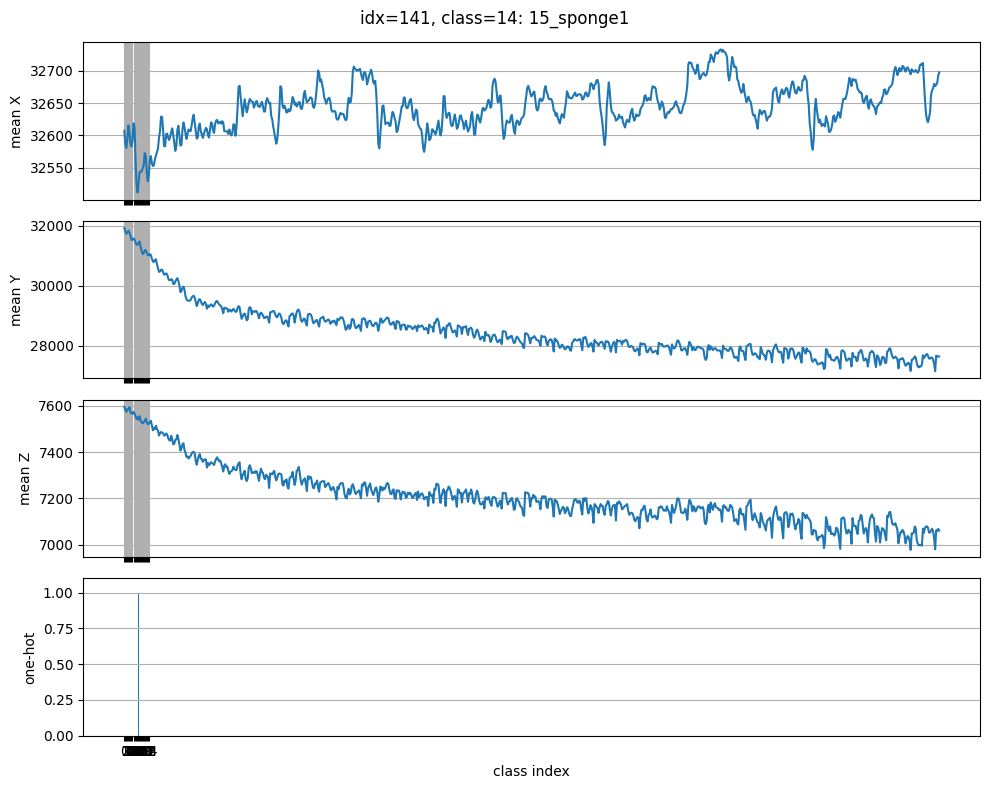

sample idx=141
  class_name : 15_sponge1
  label_idx  : 14
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


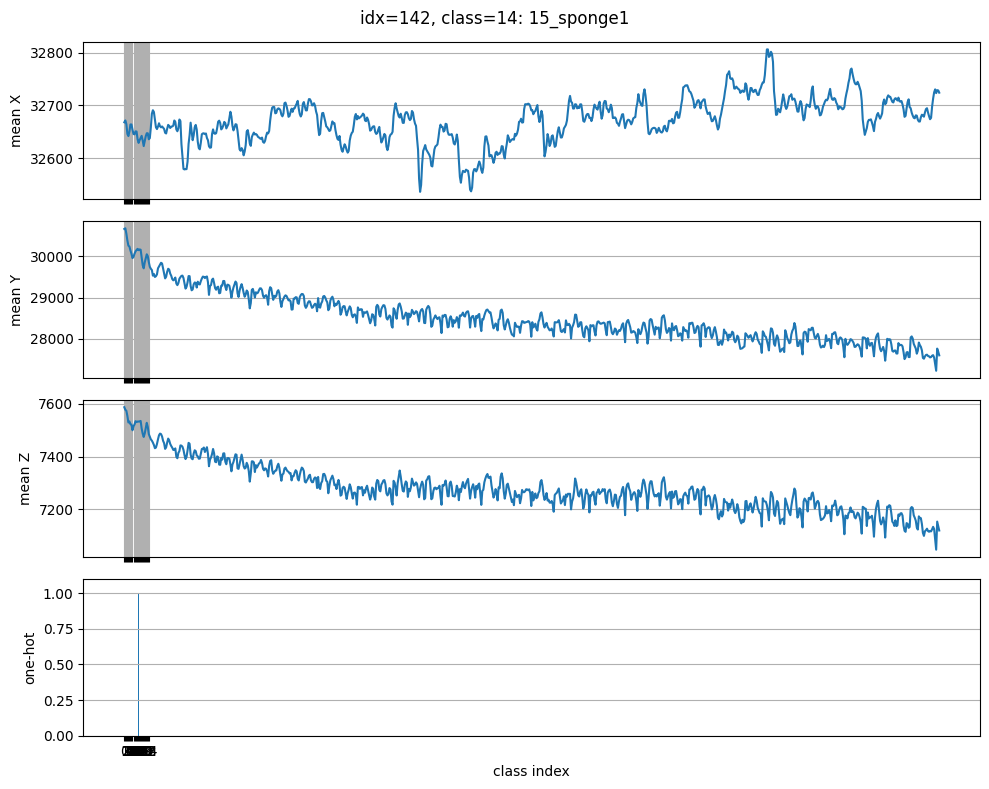

sample idx=142
  class_name : 15_sponge1
  label_idx  : 14
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]

===== class 15: 16_printed_tatami =====


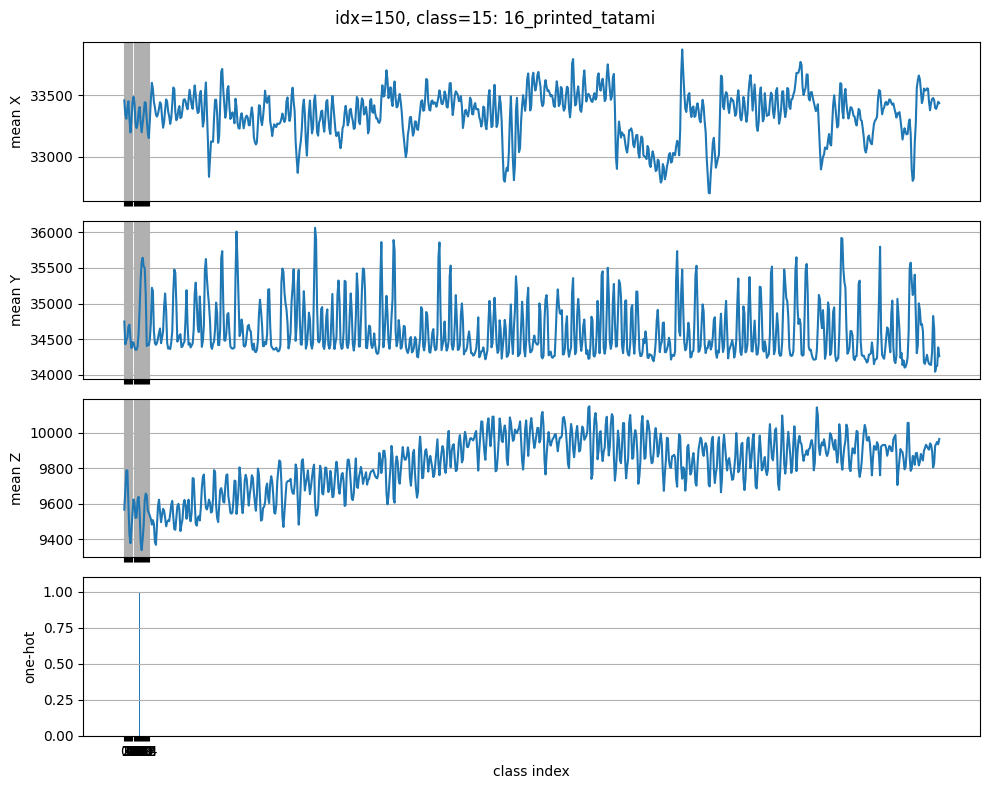

sample idx=150
  class_name : 16_printed_tatami
  label_idx  : 15
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


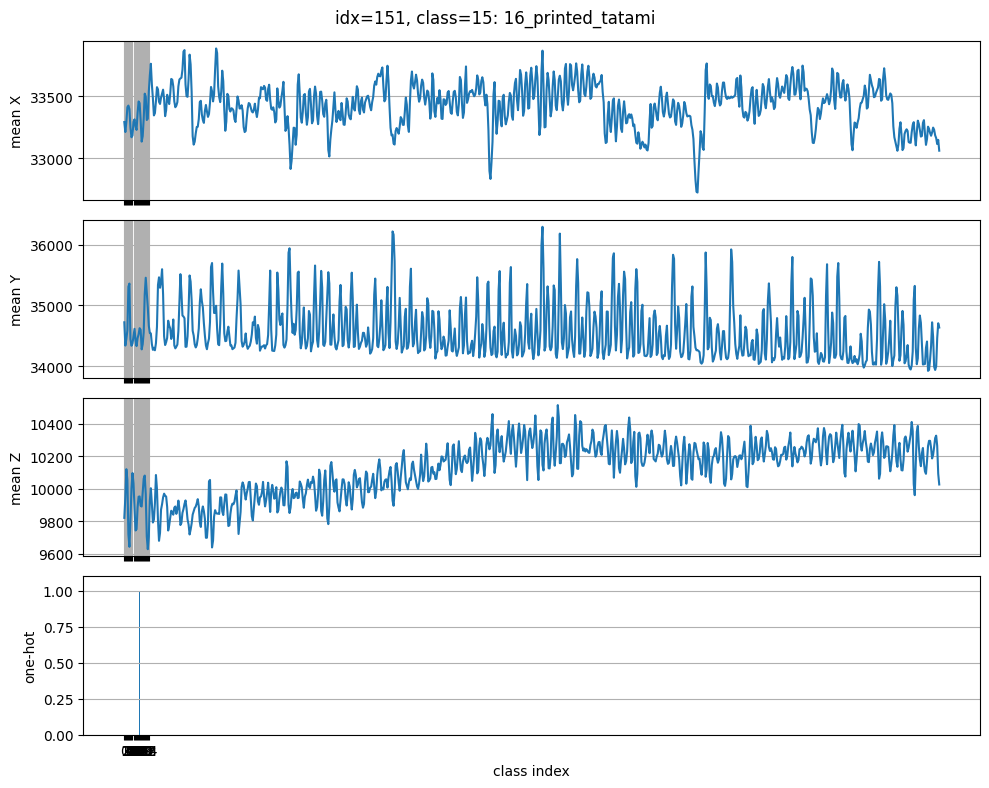

sample idx=151
  class_name : 16_printed_tatami
  label_idx  : 15
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


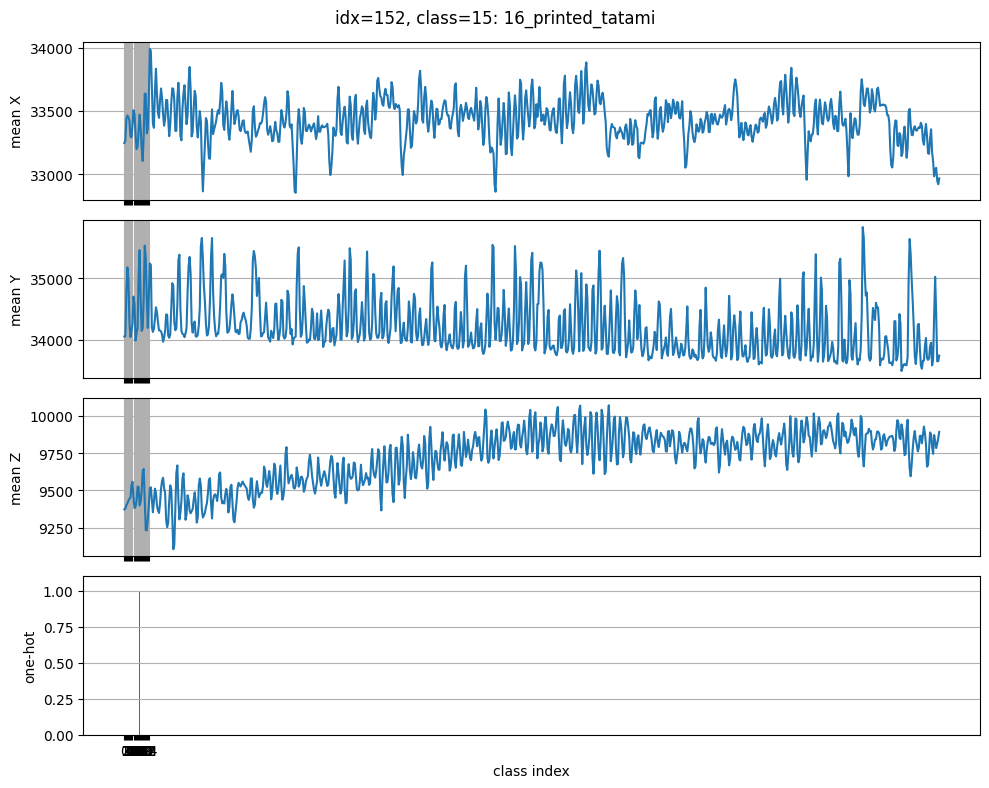

sample idx=152
  class_name : 16_printed_tatami
  label_idx  : 15
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]

===== class 16: 17_cushion1 =====


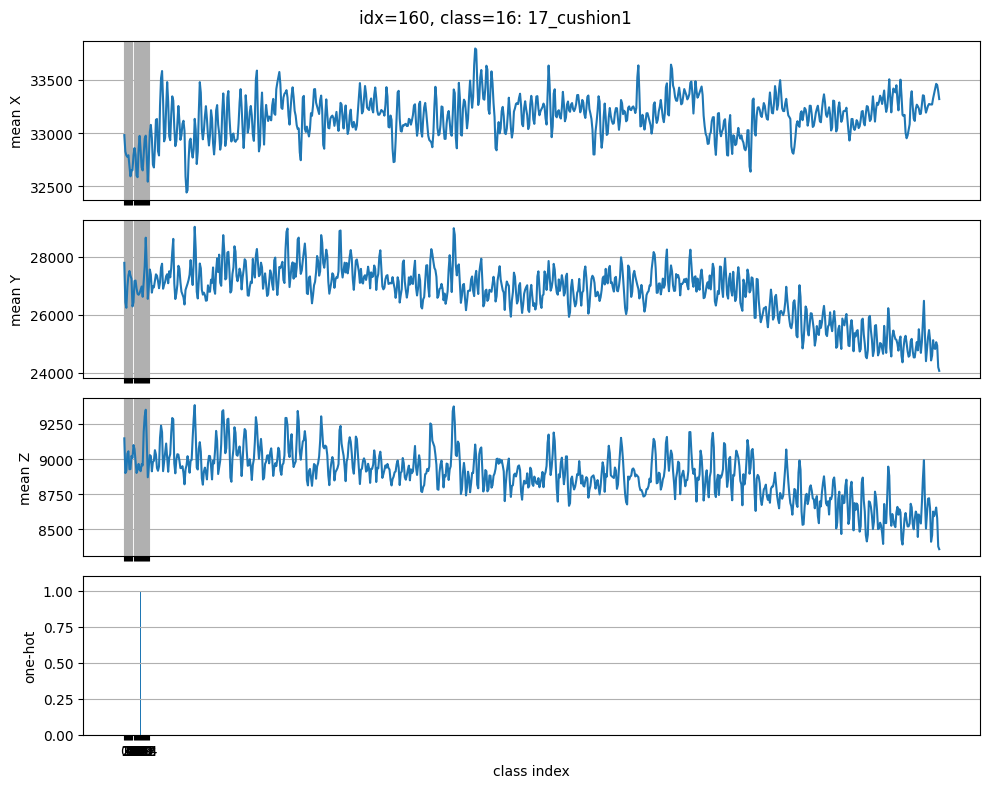

sample idx=160
  class_name : 17_cushion1
  label_idx  : 16
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0.]


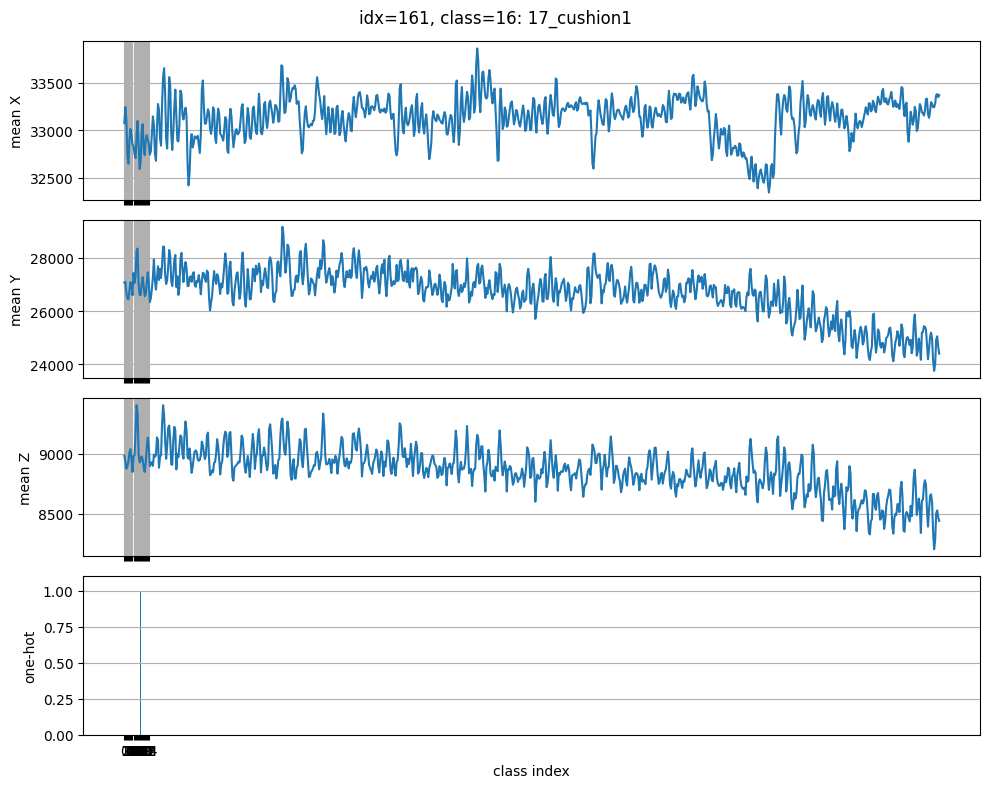

sample idx=161
  class_name : 17_cushion1
  label_idx  : 16
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0.]


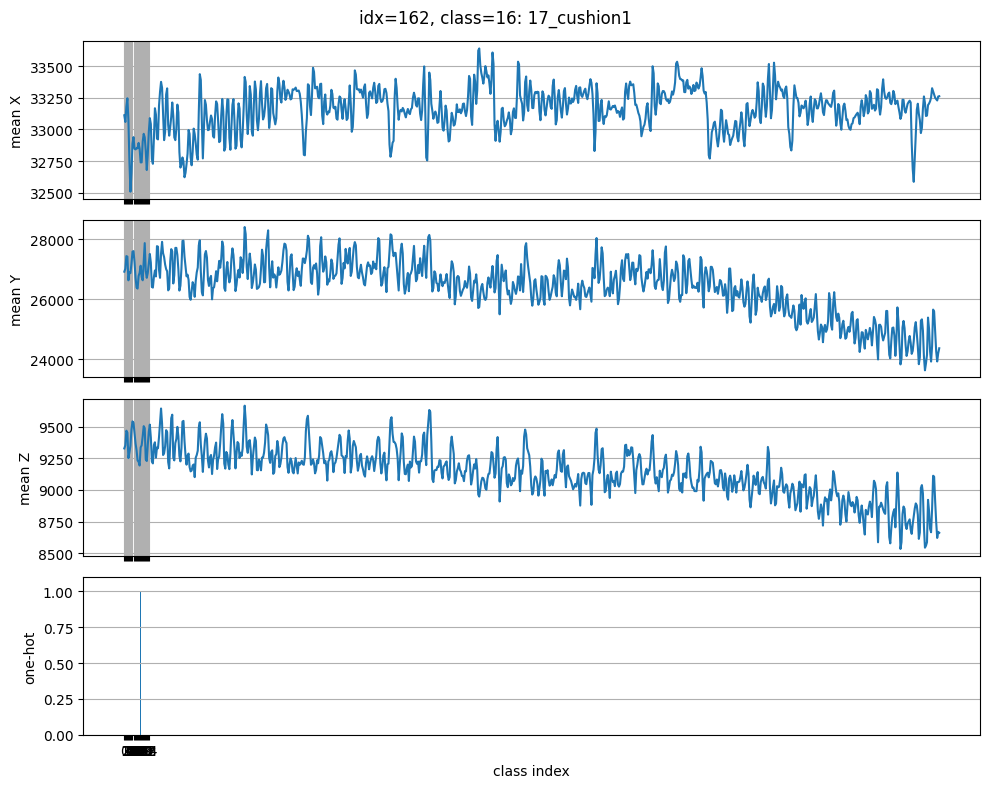

sample idx=162
  class_name : 17_cushion1
  label_idx  : 16
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0.]

===== class 17: 18_mop =====


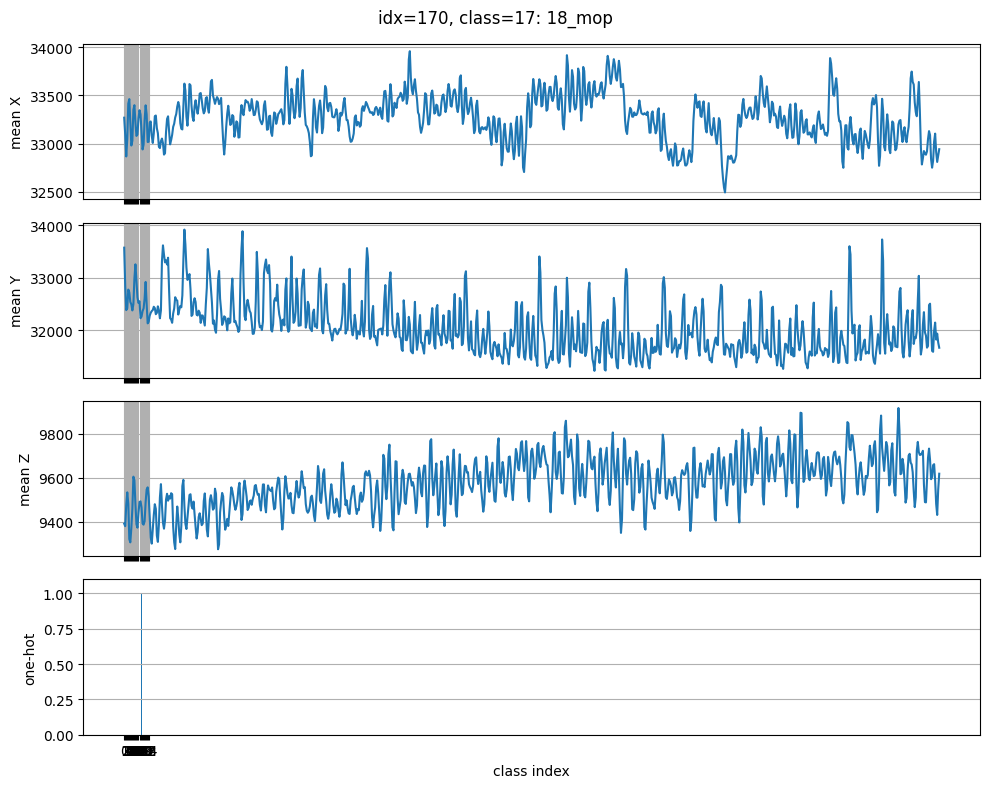

sample idx=170
  class_name : 18_mop
  label_idx  : 17
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0.]


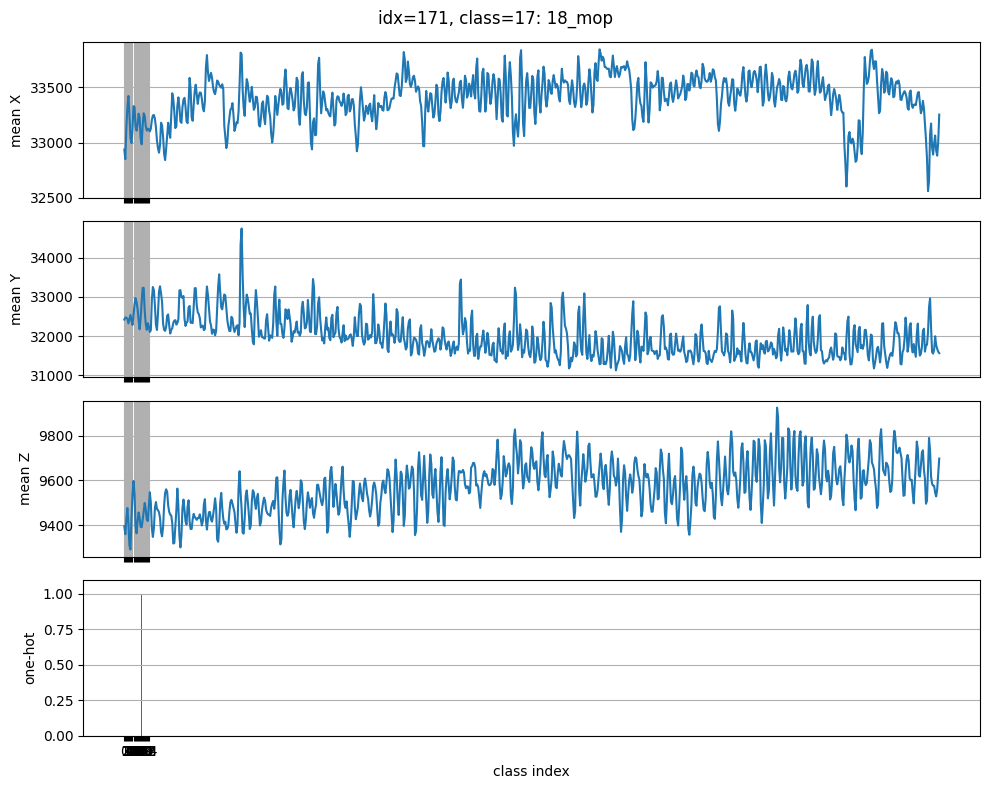

sample idx=171
  class_name : 18_mop
  label_idx  : 17
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0.]


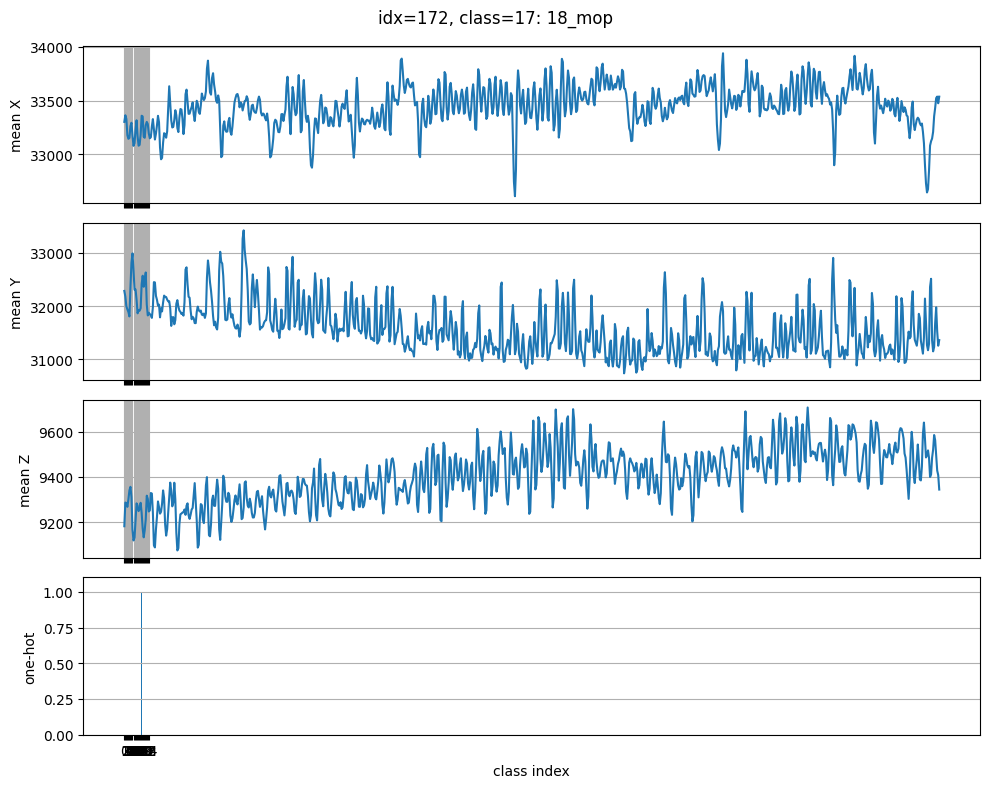

sample idx=172
  class_name : 18_mop
  label_idx  : 17
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0.]

===== class 18: 19_toilet_mat2 =====


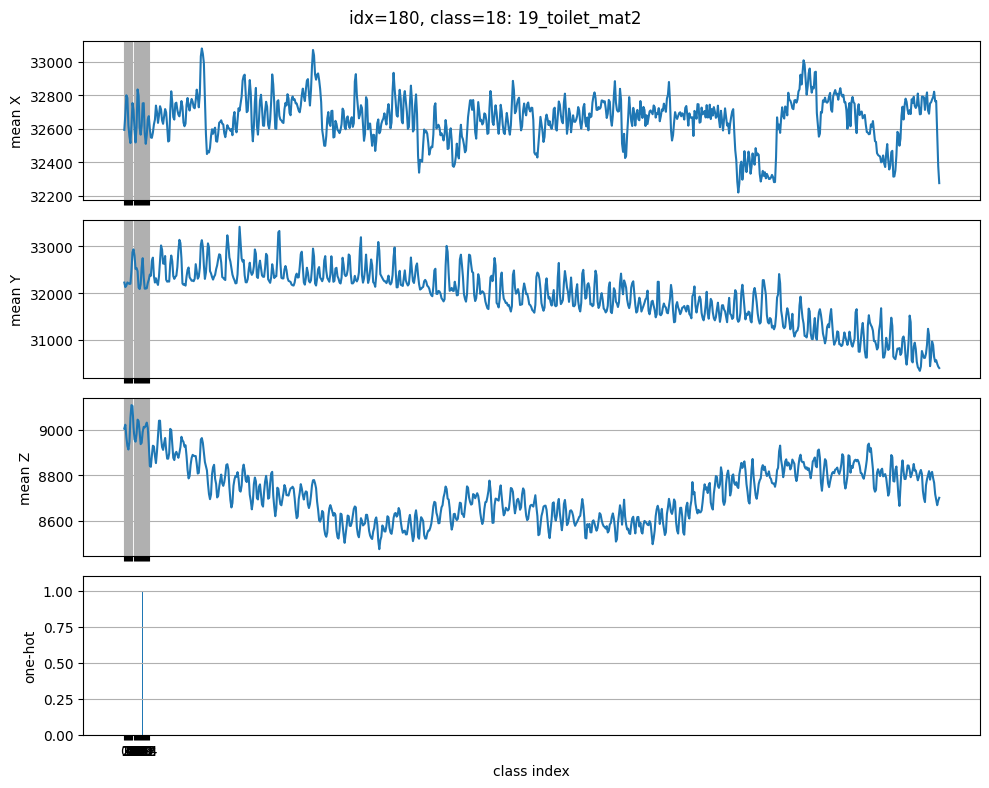

sample idx=180
  class_name : 19_toilet_mat2
  label_idx  : 18
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0.]


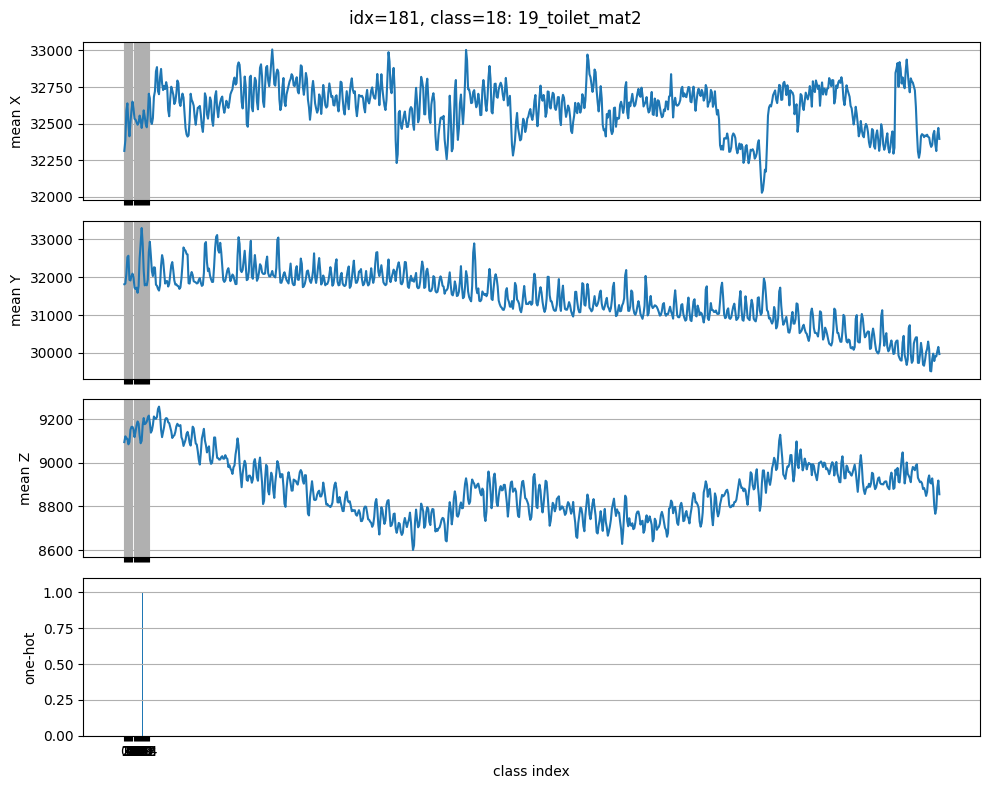

sample idx=181
  class_name : 19_toilet_mat2
  label_idx  : 18
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0.]


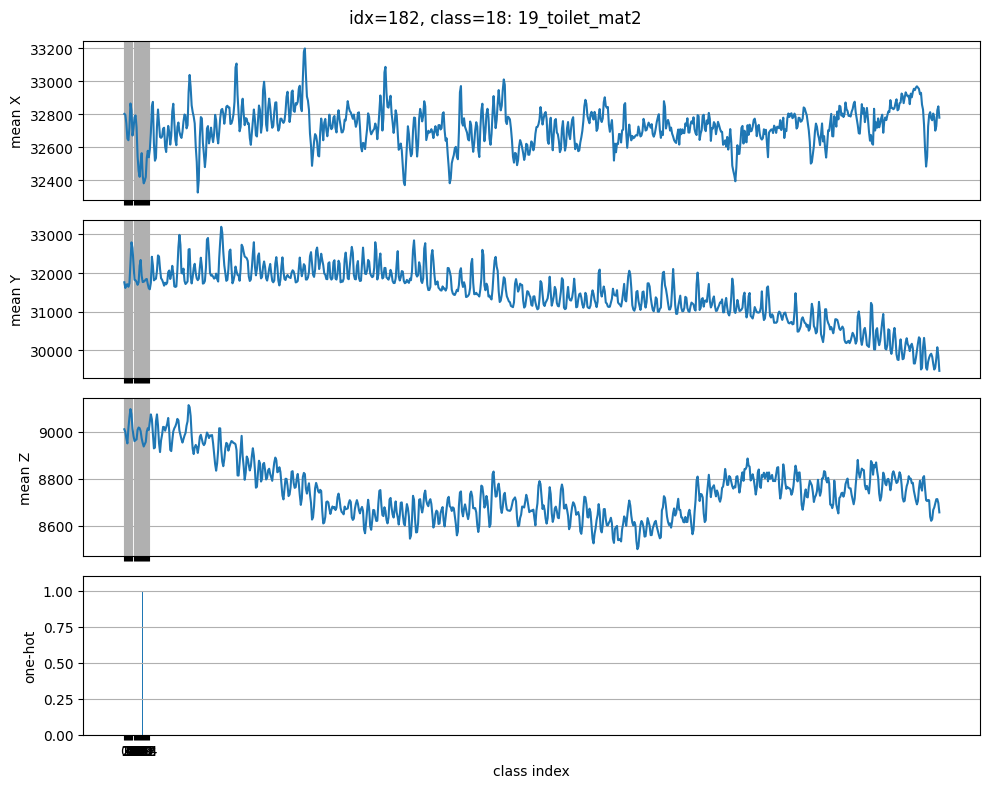

sample idx=182
  class_name : 19_toilet_mat2
  label_idx  : 18
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0.]

===== class 19: 20_fleece_sock =====


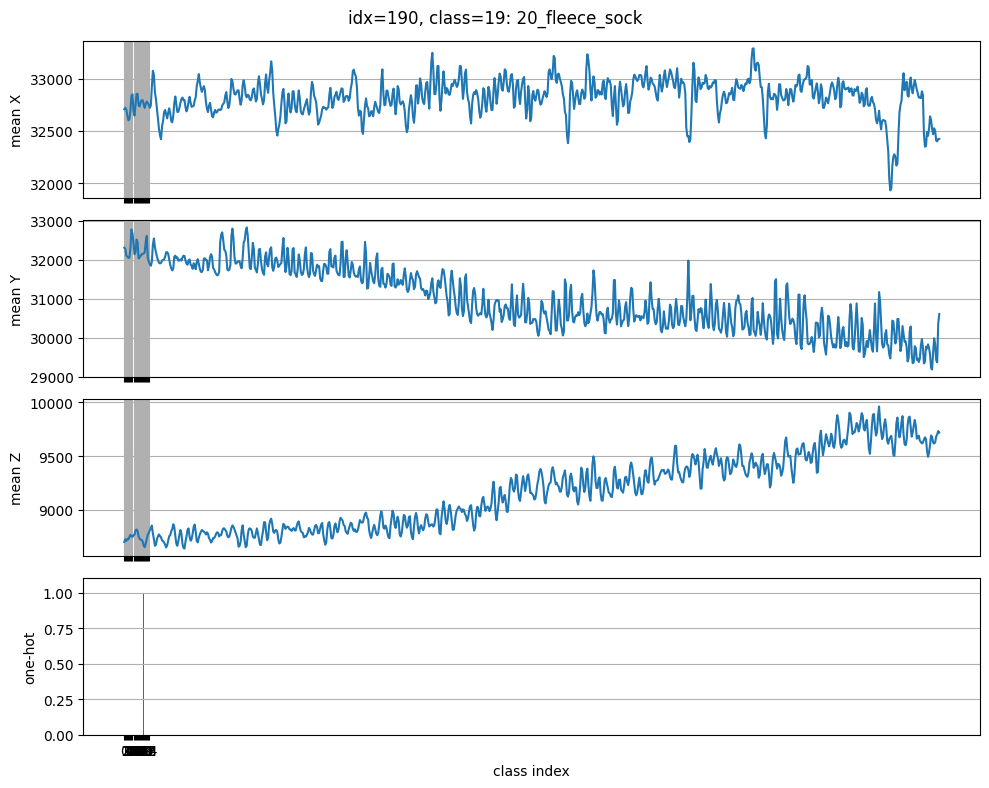

sample idx=190
  class_name : 20_fleece_sock
  label_idx  : 19
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0.]


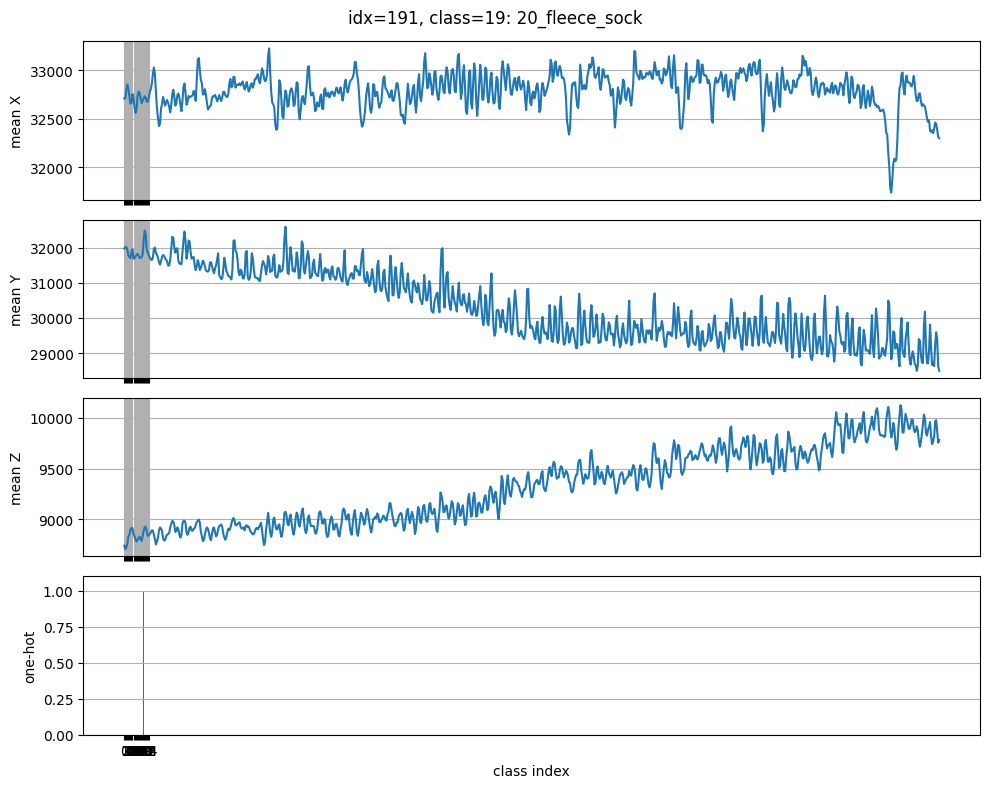

sample idx=191
  class_name : 20_fleece_sock
  label_idx  : 19
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0.]


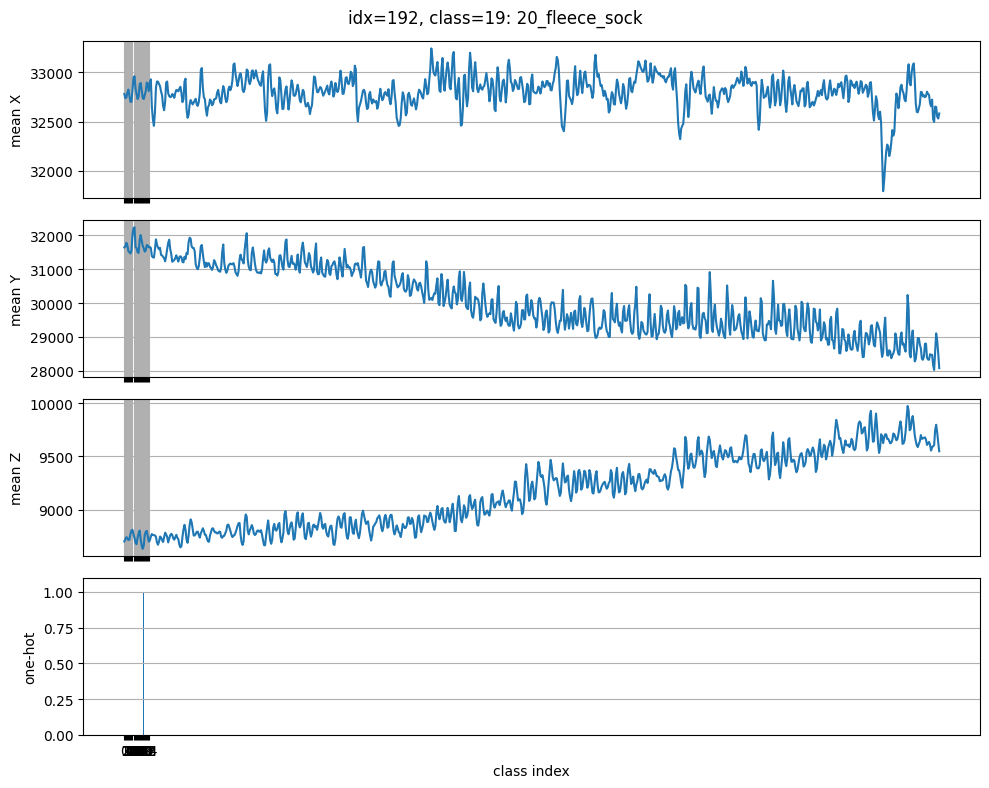

sample idx=192
  class_name : 20_fleece_sock
  label_idx  : 19
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0.]

===== class 20: 21_cushion =====


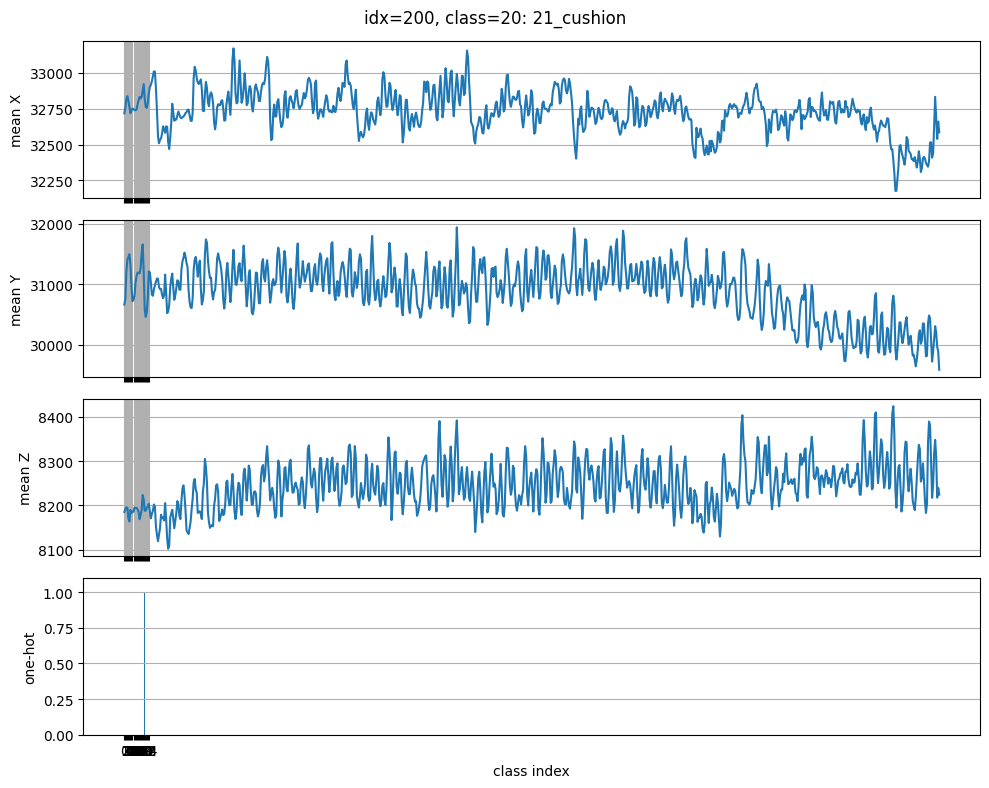

sample idx=200
  class_name : 21_cushion
  label_idx  : 20
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0.]


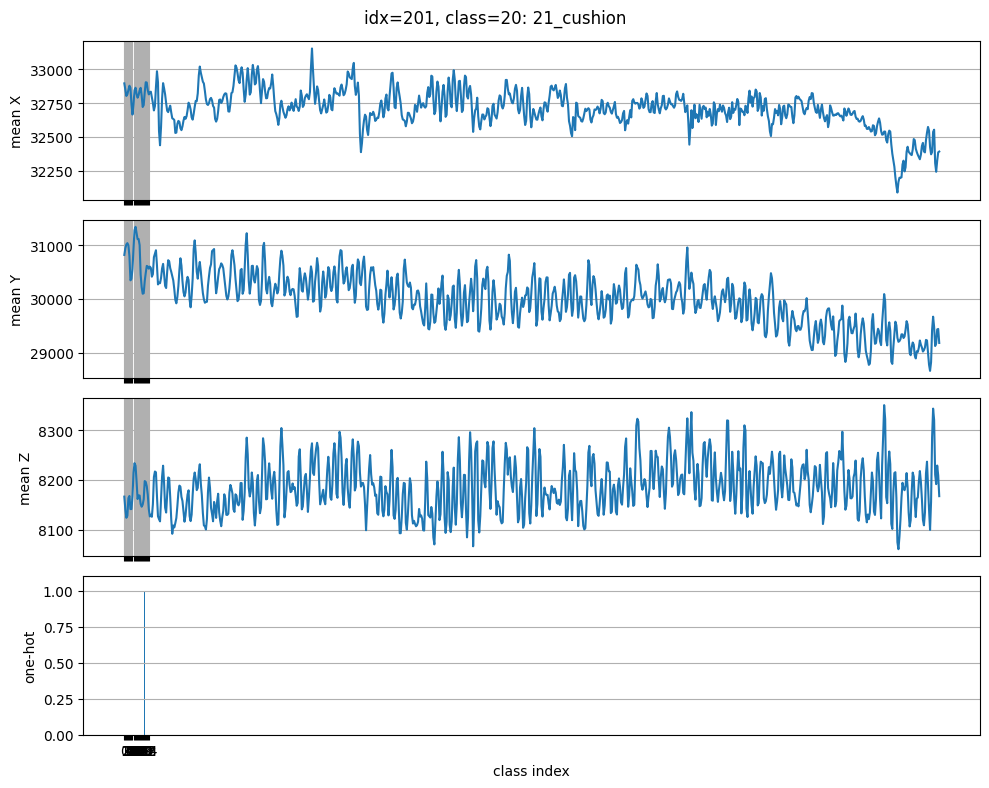

sample idx=201
  class_name : 21_cushion
  label_idx  : 20
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0.]


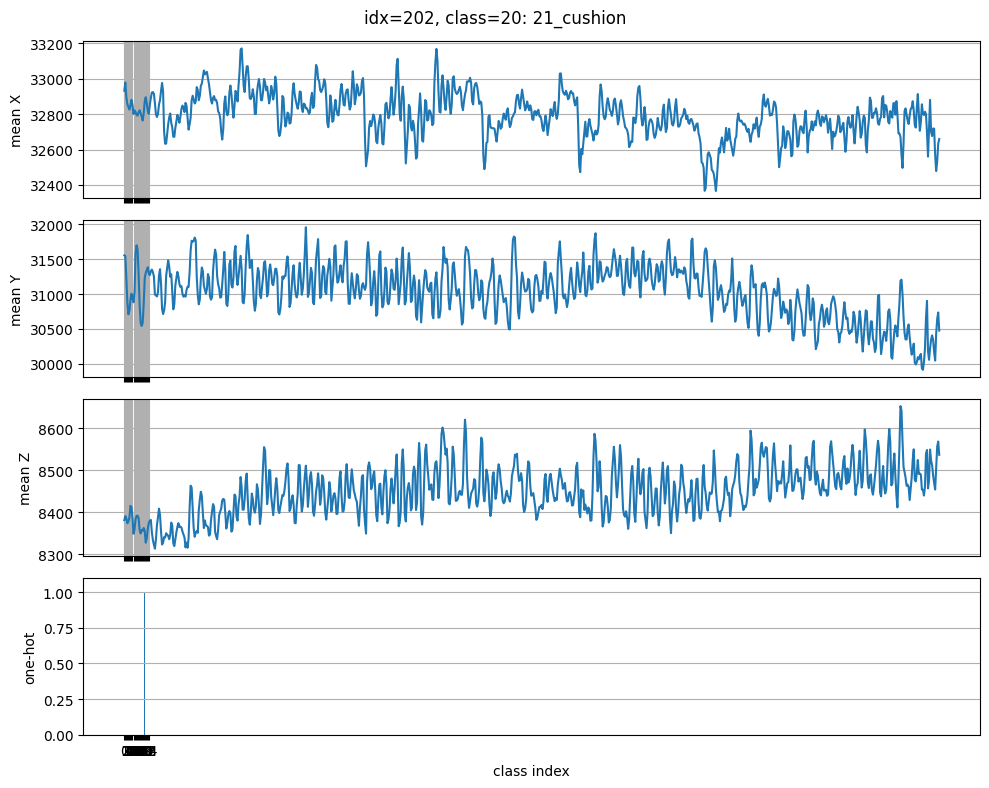

sample idx=202
  class_name : 21_cushion
  label_idx  : 20
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0.]

===== class 21: 22_carpet3 =====


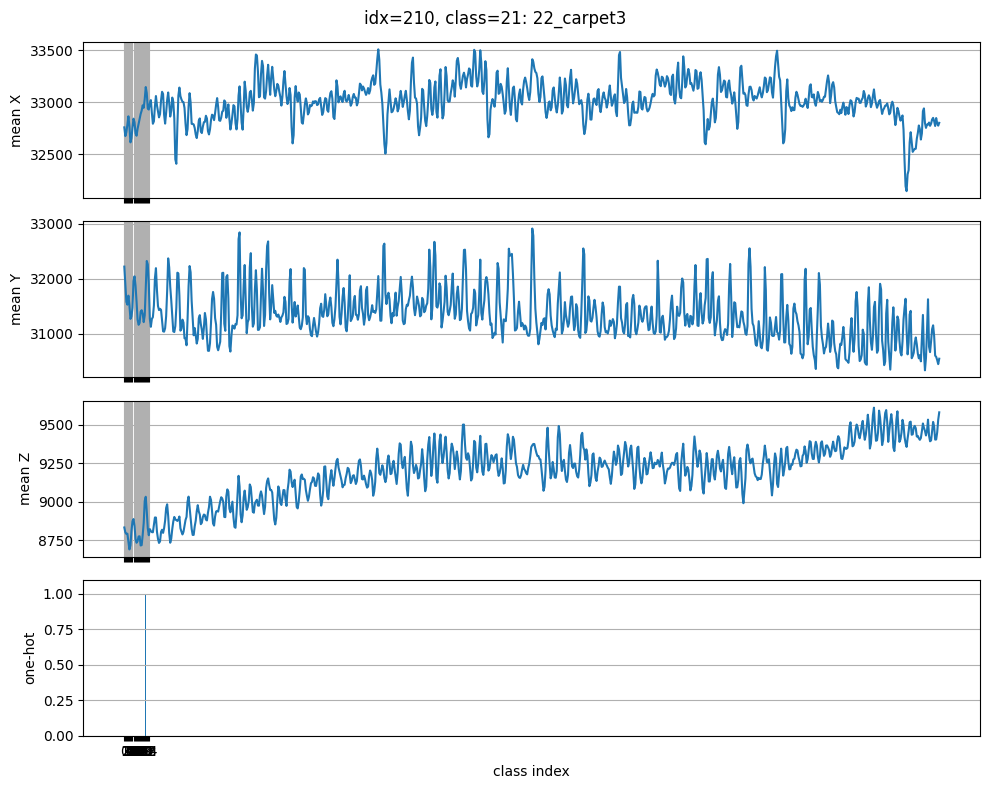

sample idx=210
  class_name : 22_carpet3
  label_idx  : 21
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0.]


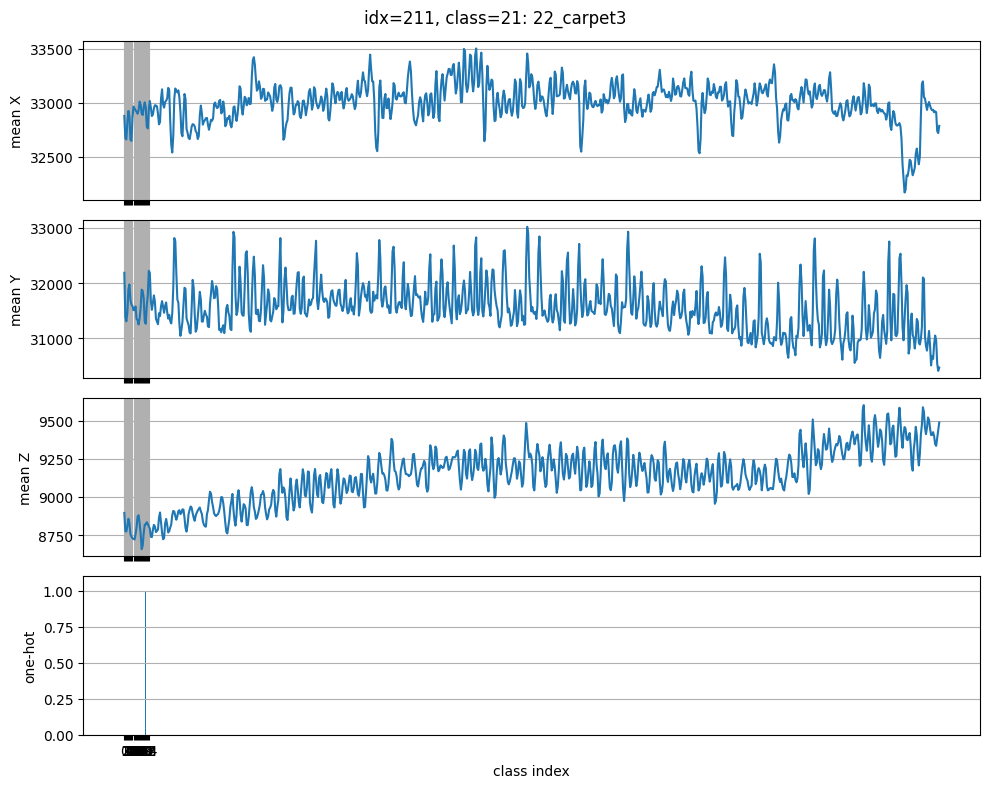

sample idx=211
  class_name : 22_carpet3
  label_idx  : 21
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0.]


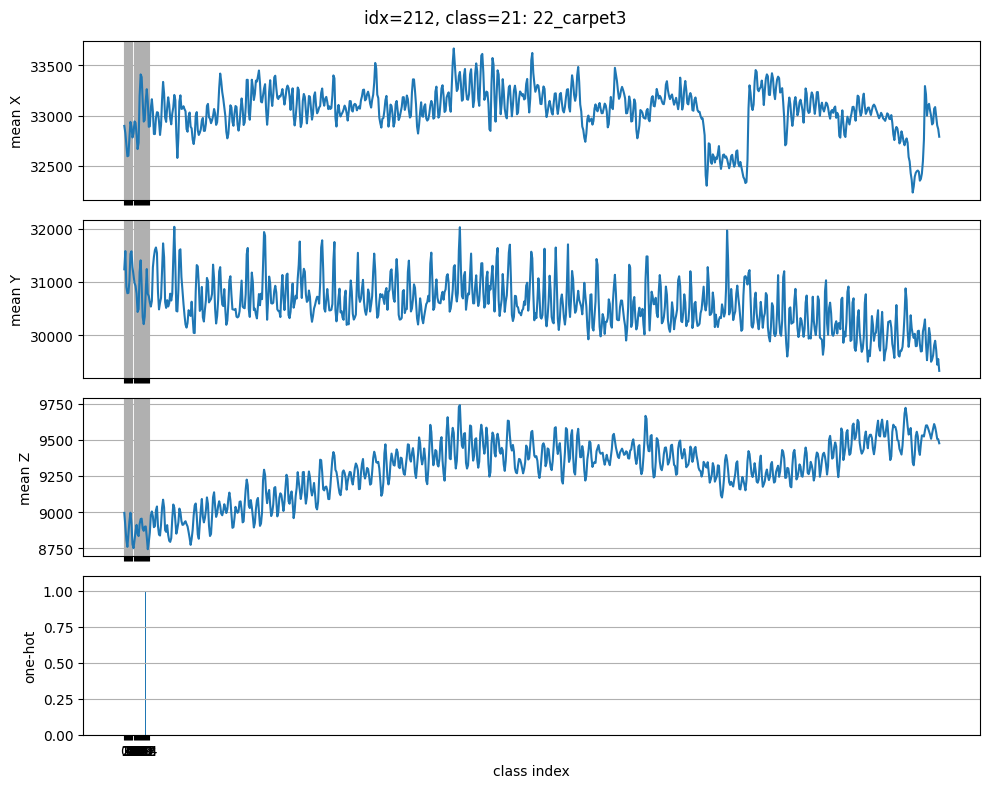

sample idx=212
  class_name : 22_carpet3
  label_idx  : 21
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0.]

===== class 22: 23_fleece_mat =====


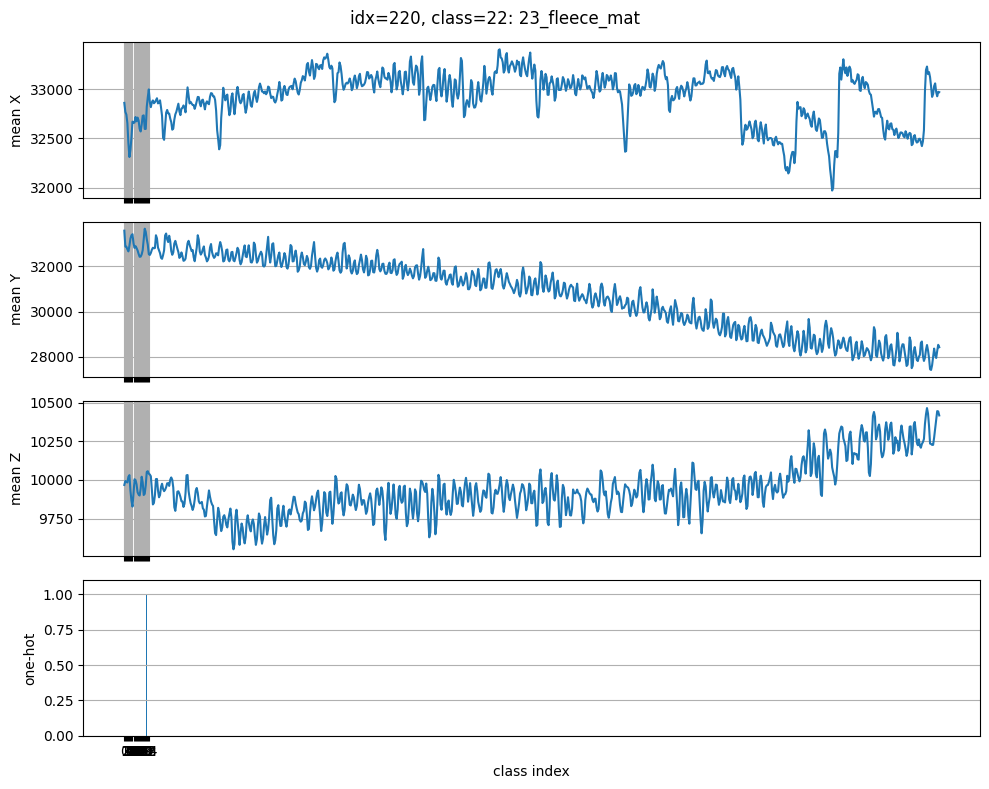

sample idx=220
  class_name : 23_fleece_mat
  label_idx  : 22
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0.]


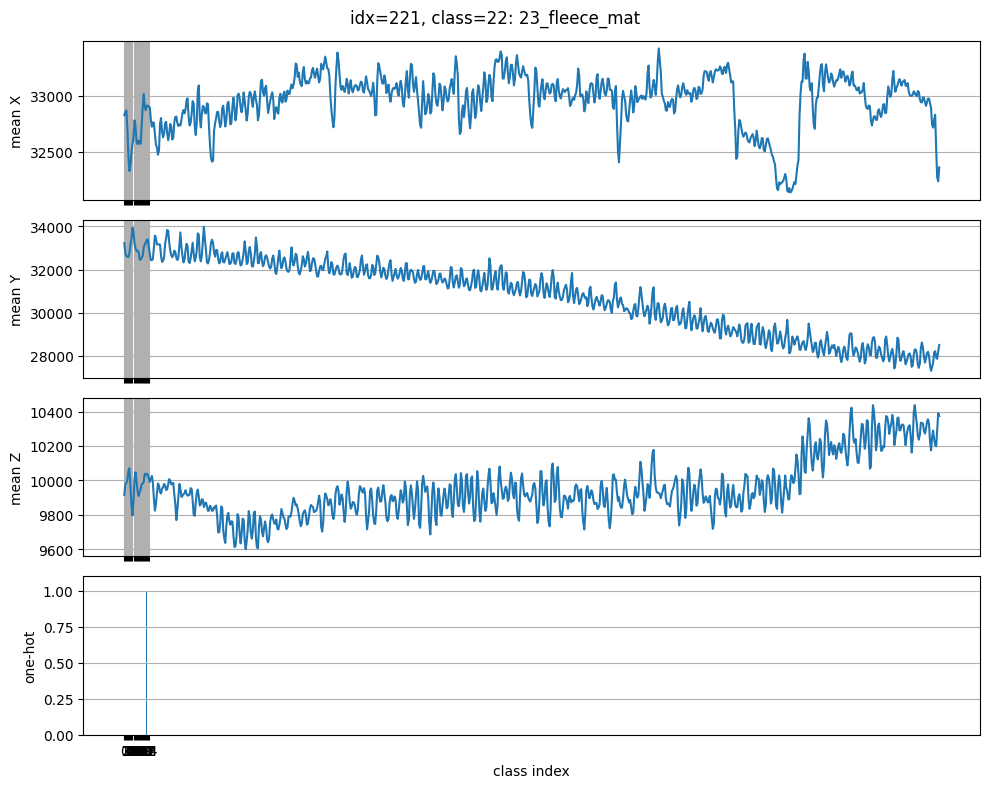

sample idx=221
  class_name : 23_fleece_mat
  label_idx  : 22
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0.]


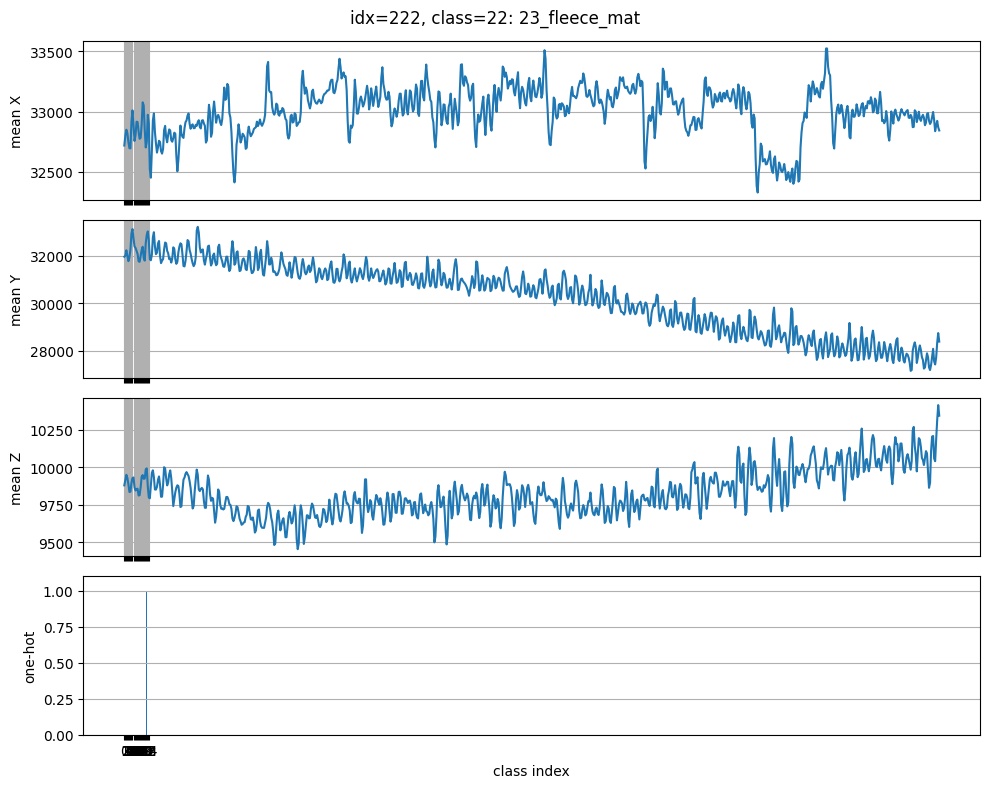

sample idx=222
  class_name : 23_fleece_mat
  label_idx  : 22
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0.]

===== class 23: 24_carpet4 =====


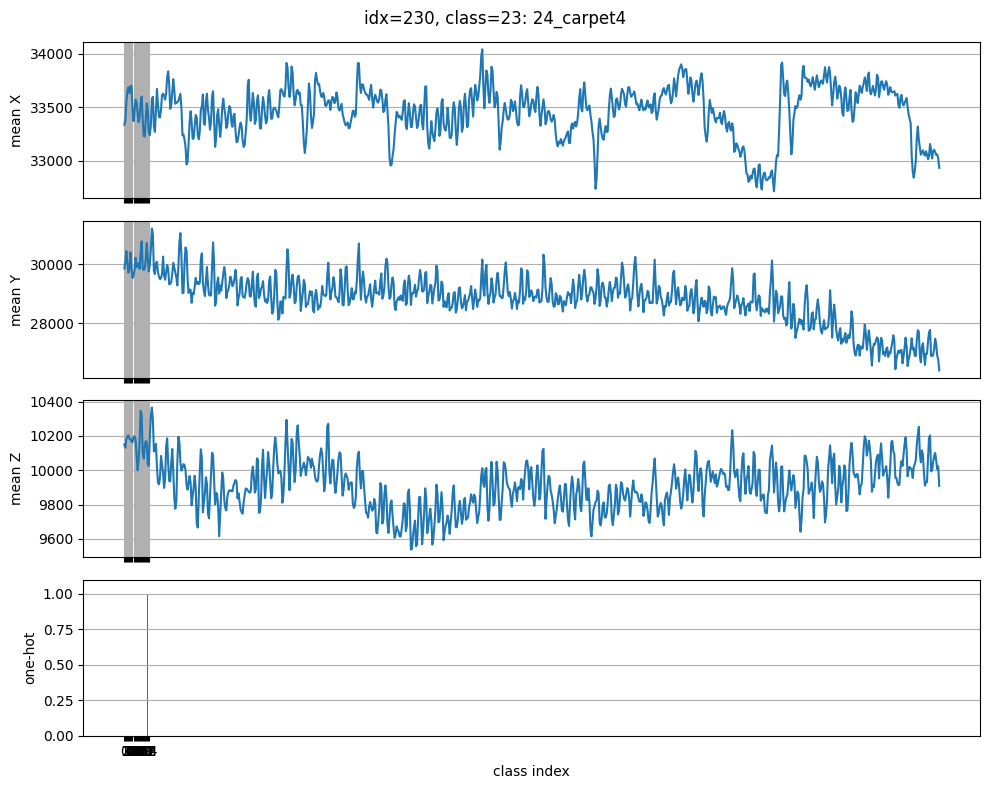

sample idx=230
  class_name : 24_carpet4
  label_idx  : 23
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0.]


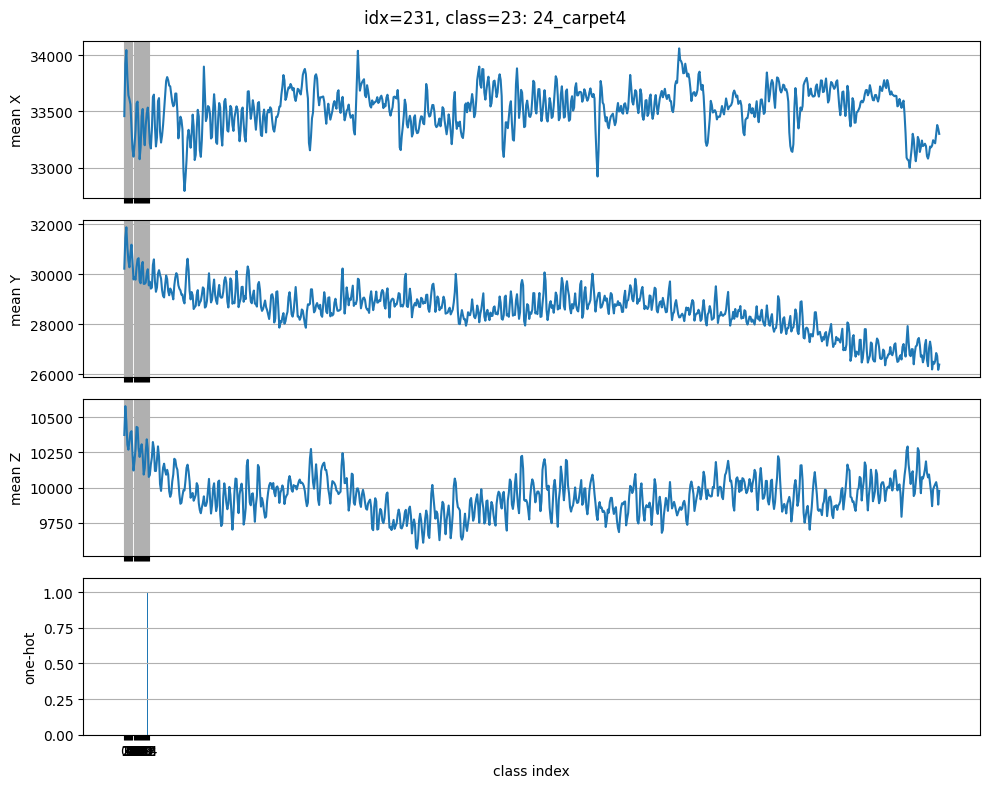

sample idx=231
  class_name : 24_carpet4
  label_idx  : 23
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0.]


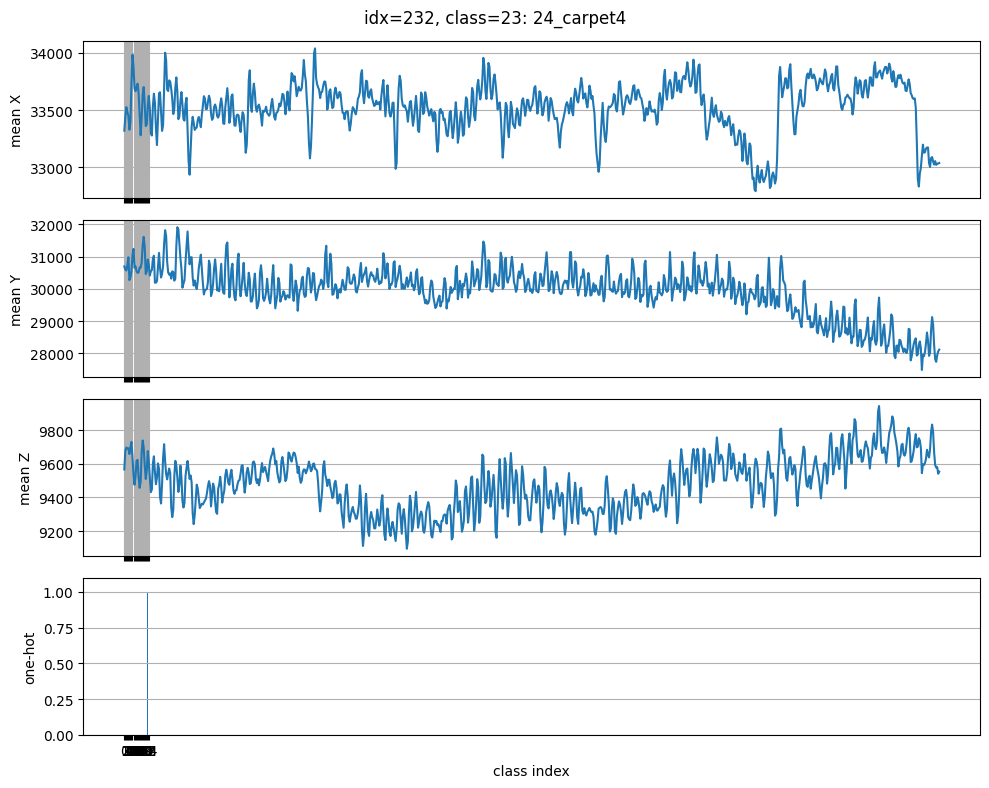

sample idx=232
  class_name : 24_carpet4
  label_idx  : 23
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0.]

===== class 24: 25_sponge2 =====


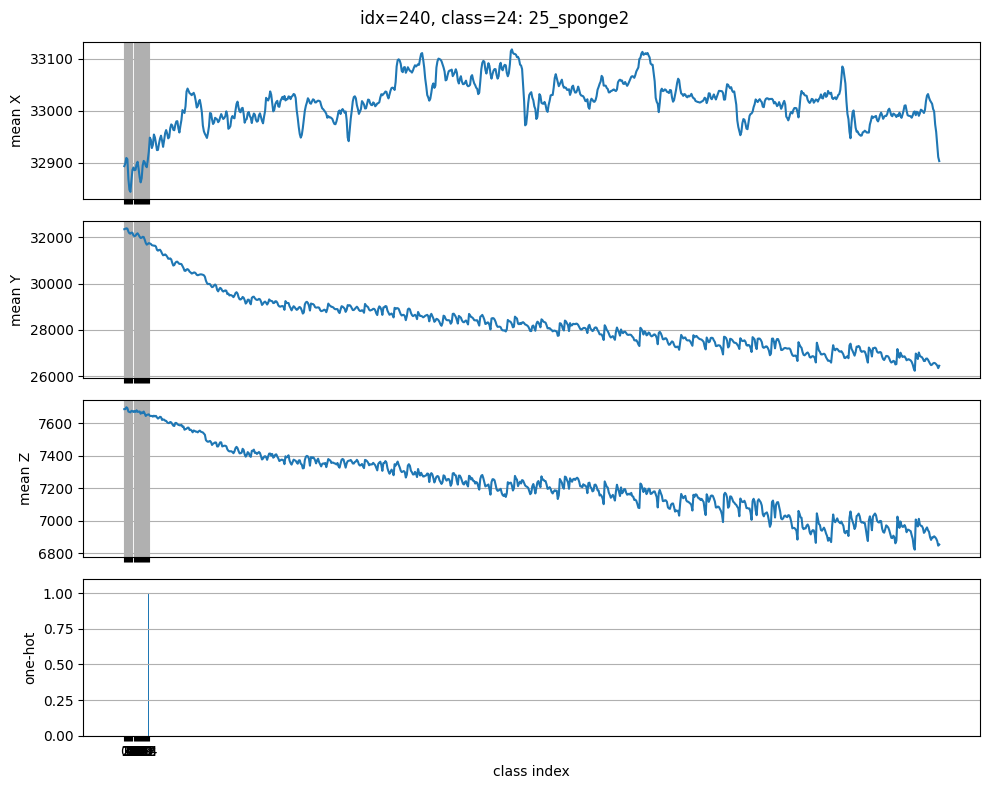

sample idx=240
  class_name : 25_sponge2
  label_idx  : 24
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1.]


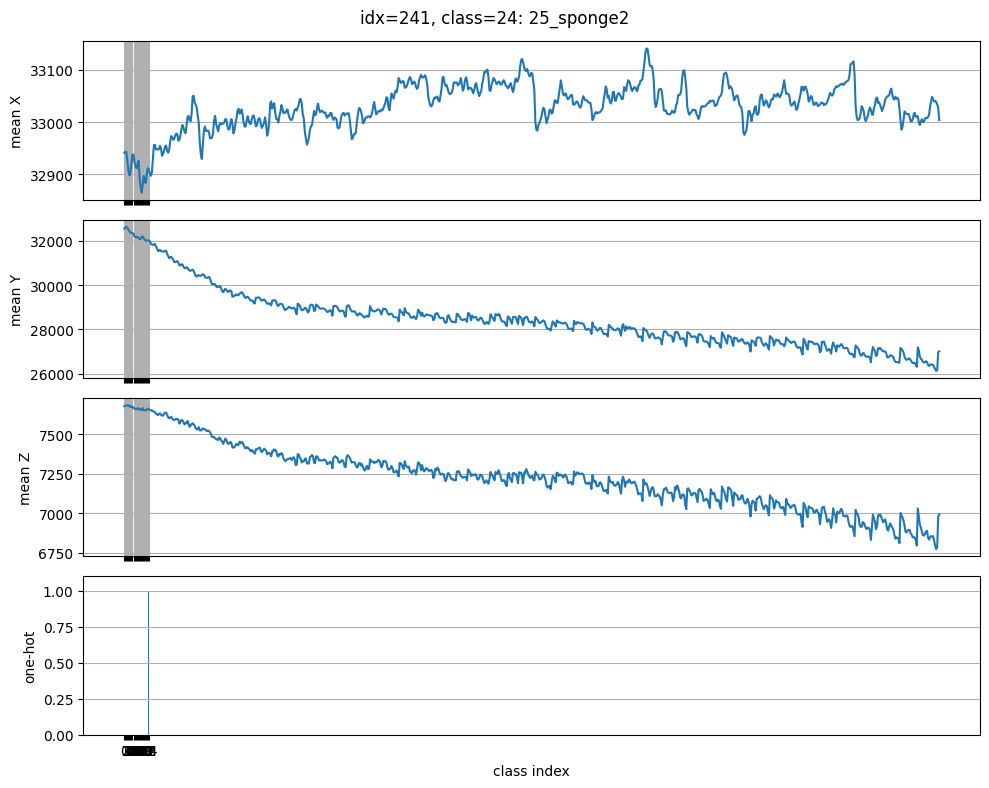

sample idx=241
  class_name : 25_sponge2
  label_idx  : 24
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1.]


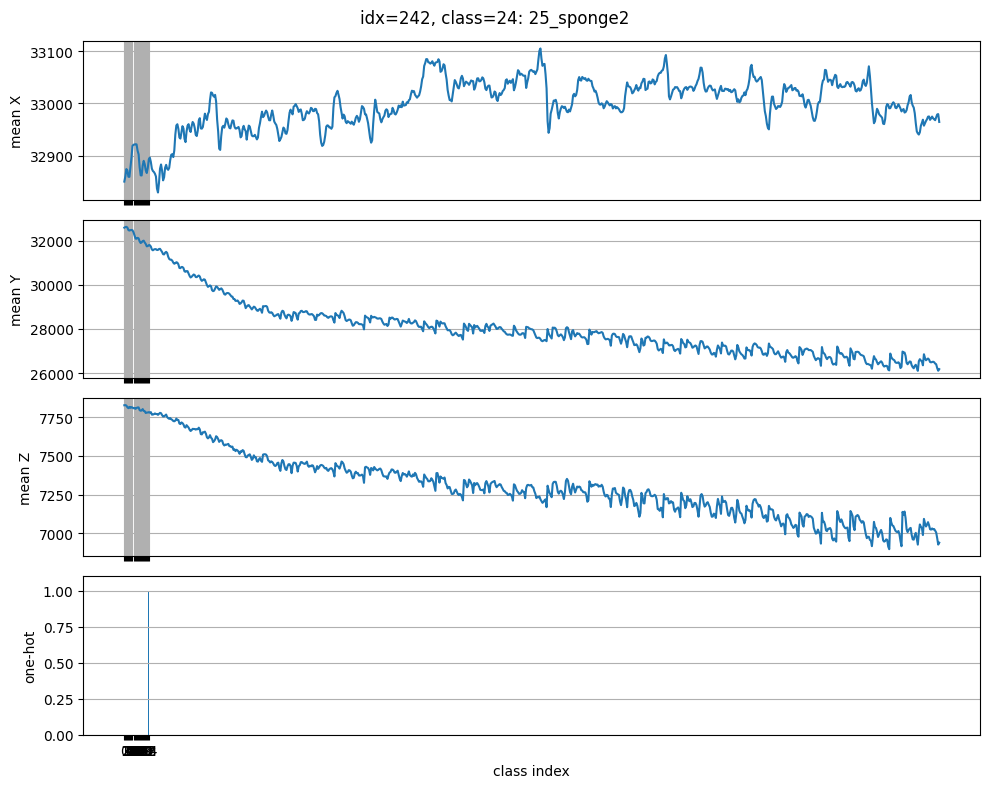

sample idx=242
  class_name : 25_sponge2
  label_idx  : 24
  one-hot    : [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1.]


In [3]:




# ==============================
#  データセットの生成
# ==============================

dataset_params = {
    "seq_start" : 400,
    "seq_end"   : 1200,
    "sequence_length": 800,
    "slicing_size" : 1,
    "augmentation_factor": 0,
    "batch_size" : 32,
    "Onehot_Encoding" : None,
    "augmentation_mu" : 0,
    "augmentation_sigma" : 0,
    "augmentation_shift" : 1,
}

# 25 クラスが入っているルートディレクトリを指定
# 例: root_dir/
#        01_table_cover/
#        02_fur_scarf/
#        ...
#        25_sponge2/
root_dir = "./All_matarials/"

dataset = TactileSequenceDataset(root_dir, dataset_params)

# ==============================
#  各クラスから最大 N サンプルずつインデックスを集める
# ==============================

def collect_indices_per_class(dataset, max_per_class=3):
    indices_per_class = {c: [] for c in range(dataset.num_classes)}

    for idx in range(len(dataset)):
        _, y = dataset[idx]  # y: one-hot (num_classes,)
        label_idx = int(y.argmax().item())

        if len(indices_per_class[label_idx]) < max_per_class:
            indices_per_class[label_idx].append(idx)

        # 全クラスで max_per_class 埋まったら終了
        if all(len(v) >= max_per_class for v in indices_per_class.values()):
            break

    return indices_per_class

indices_per_class = collect_indices_per_class(dataset, max_per_class=3)

# ==============================
#  可視化用の関数
# ==============================

def visualize_sample(dataset, idx):
    """
    単一サンプル idx について
    - x,y,z の平均値の時系列
    - one-hot の棒グラフ
    を表示する
    """
    x, y = dataset[idx]
    # x: (1, seq_len, feature_dim)
    # y: (num_classes,)

    seq = x.squeeze(0).numpy()  # (seq_len, feature_dim)

    # (seq_len, n_taxels*3) -> (seq_len, n_taxels, 3)
    seq_reshaped = seq.reshape(dataset.seq_len, dataset.n_taxels, 3)

    t = np.arange(dataset.seq_len)

    # taxel ごとの値を平均して、x,y,z の代表値を作る
    mean_xyz = seq_reshaped.mean(axis=1)   # (seq_len, 3)

    label_idx = int(y.argmax().item())
    class_name = dataset.class_names[label_idx]

    fig, axes = plt.subplots(4, 1, figsize=(10, 8), sharex=True)
    fig.suptitle(f"idx={idx}, class={label_idx}: {class_name}")

    # x 成分の平均
    axes[0].plot(t, mean_xyz[:, 0])
    axes[0].set_ylabel("mean X")
    axes[0].grid(True)

    # y 成分の平均
    axes[1].plot(t, mean_xyz[:, 1])
    axes[1].set_ylabel("mean Y")
    axes[1].grid(True)

    # z 成分の平均
    axes[2].plot(t, mean_xyz[:, 2])
    axes[2].set_ylabel("mean Z")
    axes[2].grid(True)

    # one-hot を棒グラフで可視化
    one_hot = y.numpy()  # (num_classes,)
    axes[3].bar(np.arange(dataset.num_classes), one_hot)
    axes[3].set_xlabel("class index")
    axes[3].set_ylabel("one-hot")
    axes[3].set_ylim(0, 1.1)
    axes[3].set_xticks(np.arange(dataset.num_classes))
    axes[3].grid(True, axis="y")

    plt.tight_layout()
    plt.show()

    # コンソールにも出しておくと確認しやすい
    print(f"sample idx={idx}")
    print(f"  class_name : {class_name}")
    print(f"  label_idx  : {label_idx}")
    print(f"  one-hot    : {one_hot}")

# ==============================
#  各クラスについて 3 サンプルずつ可視化
# ==============================

for label_idx, idx_list in indices_per_class.items():
    class_name = dataset.class_names[label_idx]
    print(f"\n===== class {label_idx}: {class_name} =====")
    for idx in idx_list:
        visualize_sample(dataset, idx)
